# 🛰️ Analisis Satelit (GSMaP & GPM IMERG), Reanalisis ERA5, dan Sensor AWS IoT Jerukagung
Notebook ini menyajikan analisis komprehensif perbandingan data curah hujan dan variabel meteorologi antara produk satelit (GSMaP, GPM IMERG), reanalisis ERA5, serta stasiun pengamatan stasiun staklim Jerukagung, Kebumen.

In [2]:
import sys
if hasattr(sys.stdout, 'reconfigure'):
    sys.stdout.reconfigure(encoding='utf-8')
# Set 1: Inisialisasi Import Semua Library & Dependensi
import os
import sys
import glob
import warnings
import numpy as np
import pandas as pd
import scipy.stats as stats
from scipy.stats import wilcoxon, mannwhitneyu
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
from IPython.display import display, Markdown, HTML

# Set Directory Base & Hasil Analisis
base_dir = os.path.dirname(os.path.abspath(__file__)) if '__file__' in globals() else os.path.abspath('Google_Earth_Engine') if os.path.exists('Google_Earth_Engine') else os.getcwd()
out_dir = os.path.join(base_dir, 'Hasil_Analisis')
os.makedirs(out_dir, exist_ok=True)

# Nonaktifkan warning berlebihan & atur tema grafik
warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 600
sns.set_theme(style='whitegrid')


## 1. Inspeksi & Deteksi Variabel Dataset

In [4]:
# Definisi Path Dataset
base_dir = r"d:/Github/Projek_Rainfall/Google_Earth_Engine"

file_paths = {
    'GSMaP': os.path.join(base_dir, 'Data_Satelit', 'Rainfall_GSMaP_TimeSeries_UNIX.csv'),
    'IMERG': os.path.join(base_dir, 'Data_Satelit', 'Rainfall_IMERG_TimeSeries_UNIX.csv'),
    'ERA5_Reanalisis': os.path.join(base_dir, 'Data_Satelit', 'ERA5_Hourly_All_Requested_Features_2000_2026.csv'),
    'AWS_Lokal': os.path.join(base_dir, 'Data_Satelit', 'id-05_clear_data_hourly.csv')
}

# Fungsi deteksi otomatis untuk semua variabel
def detect_columns(df):
    cols = [c.lower() for c in df.columns]
    
    # Detect Time
    dt_col, unix_col = None, None
    for c in df.columns:
        cl = c.lower()
        if 'unix' in cl and unix_col is None:
            unix_col = c
        elif ('date' in cl or 'time' in cl) and ('unix' not in cl) and dt_col is None:
            dt_col = c
            
    # Detect Variables
    var_keywords = {
        'rain': ['rainfall', 'precipitation', 'precip', 'rain', 'rainrate', 'total_precipitation', 'tp', 'hourly_precipitation'],
        'temperature': ['temperature', 'temp'],
        'humidity': ['humidity', 'rh', 'relative_humidity'],
        'pressure': ['pressure', 'pres'],
        'dewpoint': ['dew_point', 'dewpoint', 'dew']
    }
    
    var_cols = {}
    for var, keywords in var_keywords.items():
        found_cols = []
        for c in df.columns:
            cl = c.lower()
            if any(k in cl for k in keywords):
                # Prioritaskan Gauge-Calibrated jika ada (untuk hujan)
                if 'gc' in cl:
                    found_cols.insert(0, c)
                else:
                    found_cols.append(c)
        if found_cols:
            var_cols[var] = found_cols[0]
    
    return dt_col, unix_col, var_cols

datasets_raw = {}
summary_data = []


for name, path_file in file_paths.items():
    if not os.path.exists(path_file):
        print(f"File not found: {path_file}")
        continue
        
    if path_file.endswith('.csv'):
        df = pd.read_csv(path_file)
    elif path_file.endswith('.parquet'):
        df = pd.read_parquet(path_file)
        
    dt_col, unix_col, var_cols = detect_columns(df)
    
    # Kalkulasi resolusi
    resolution = "Unknown"
    start_date, end_date = "Unknown", "Unknown"
    if unix_col and not df.empty:
        df = df.sort_values(unix_col)
        diffs = df[unix_col].diff().dropna()
        mode_diff = diffs.mode().iloc[0] if not diffs.empty else 0
        if mode_diff == 3600:
            resolution = "Hourly"
        elif mode_diff == 1800:
            resolution = "30-Minute"
        elif mode_diff == 86400:
            resolution = "Daily"
        else:
            resolution = f"{mode_diff} seconds"
            
    if dt_col and not df.empty:
        start_date = str(df[dt_col].iloc[0])
        end_date = str(df[dt_col].iloc[-1])
        
    summary_data.append({
        'Dataset': name,
        'Records': len(df),
        'Datetime Field': dt_col,
        'Unix Field': unix_col,
        'Variables Found': ", ".join(var_cols.keys()),
        'Resolution': resolution,
        'Start': start_date,
        'End': end_date
    })
    
    datasets_raw[name] = df

# Generate Markdown Table
md_table = "| Dataset | Records | Datetime Field | Unix Field | Variables Found | Resolution | Start | End |\n"
md_table += "|---|---|---|---|---|---|---|---|\n"
for row in summary_data:
    md_table += f"| {row['Dataset']} | {row['Records']:,} | `{row['Datetime Field']}` | `{row['Unix Field']}` | {row['Variables Found']} | {row['Resolution']} | {row['Start']} | {row['End']} |\n"

display(Markdown("### Data Inspection Summary\n" + md_table))


<IPython.core.display.Markdown object>


## 2. Standarisasi Waktu & Resampling Jam-Jaman (1-Hour)

In [6]:
processed_dfs = {}
validation_logs = []

for name, df in datasets_raw.items():
    df_proc = df.copy()
    dt_col, unix_col, var_cols = detect_columns(df_proc)
    
    if not unix_col or not var_cols:
        validation_logs.append(f"- **{name}**: Failed. Missing Unix or any known variable column.")
        continue
        
    # Standardize time
    df_proc = df_proc.dropna(subset=[unix_col] + list(var_cols.values()), how='all')
    df_proc[unix_col] = df_proc[unix_col].astype('float64') 
    
    if df_proc[unix_col].max() > 1e11:
        df_proc[unix_col] = df_proc[unix_col] / 1000.0
    
    # Cast unixtime to datetime strictly as UTC
    df_proc['standard_time'] = pd.to_datetime(df_proc[unix_col], unit='s', utc=True)
    df_proc = df_proc.set_index('standard_time')
    
    # Extract only the detected variables
    df_vars = df_proc[list(var_cols.values())].copy()
    
    # Rename columns to standardized format (e.g., rain_GSMaP, temp_ERA5_ML)
    rename_mapping = {col_name: f"{var_type}_{name}" for var_type, col_name in var_cols.items()}
    df_vars = df_vars.rename(columns=rename_mapping)
    
    validation_logs.append(f"- **{name}**: Kept variables: {', '.join(var_cols.keys())}. No temporal resampling applied (exact match only).")
    
    # METEOROLOGICAL LOGIC: Align all datasets to 1-Hour intervals (1h)
    # Rain is accumulated (sum), other variables are averaged (mean)
    resample_dict = {}
    for col in df_vars.columns:
        if col.startswith('rain_'):
            resample_dict[col] = 'sum'
        else:
            resample_dict[col] = 'mean'
    
    if not df_vars.empty:
        df_vars = df_vars.resample('1h').agg(resample_dict)
    
    processed_dfs[name] = df_vars.dropna(how='all')

display(Markdown("### Temporal Standardization Logs\n" + "\n".join(validation_logs)))


<IPython.core.display.Markdown object>


## 3. Penggabungan Data (Dataset Merging & Alignment)

In [8]:
# Merge all datasets on standard_time (Index)
df_merged = None

for name, df in processed_dfs.items():
    if df_merged is None:
        df_merged = df
    else:
        df_merged = df_merged.merge(df, left_index=True, right_index=True, how='outer')

# Drop rows where ALL values are NA
df_merged = df_merged.dropna(how='all')

# Restrict analysis timeline to 2025 onwards
df_merged = df_merged[(df_merged.index >= '2025-01-01 00:00:00') & (df_merged.index <= '2026-05-31 23:59:59')]

overlap_start = df_merged.index.min()
overlap_end = df_merged.index.max()
overlap_duration = overlap_end - overlap_start

display(Markdown(f"### Overlap Alignment Summary\n"
                 f"- **Overlap Duration**: {overlap_duration}\n"
                 f"- **Overlapping Record Count**: {len(df_merged):,}\n"
                 f"- **Start Overlap**: {overlap_start}\n"
                 f"- **End Overlap**: {overlap_end}"))

df_merged.head()


<IPython.core.display.Markdown object>


## 4. Analisis Korelasi Variabel (Scatter Plots & Time Series)

In [10]:
# Sel 9.1: Inisialisasi Variabel Analisis
var_types = ['temperature', 'humidity', 'pressure', 'dewpoint', 'rain']
print(" Variabel analisis diinisialisasi:", var_types)


 Variabel analisis diinisialisasi: ['temperature', 'humidity', 'pressure', 'dewpoint', 'rain']


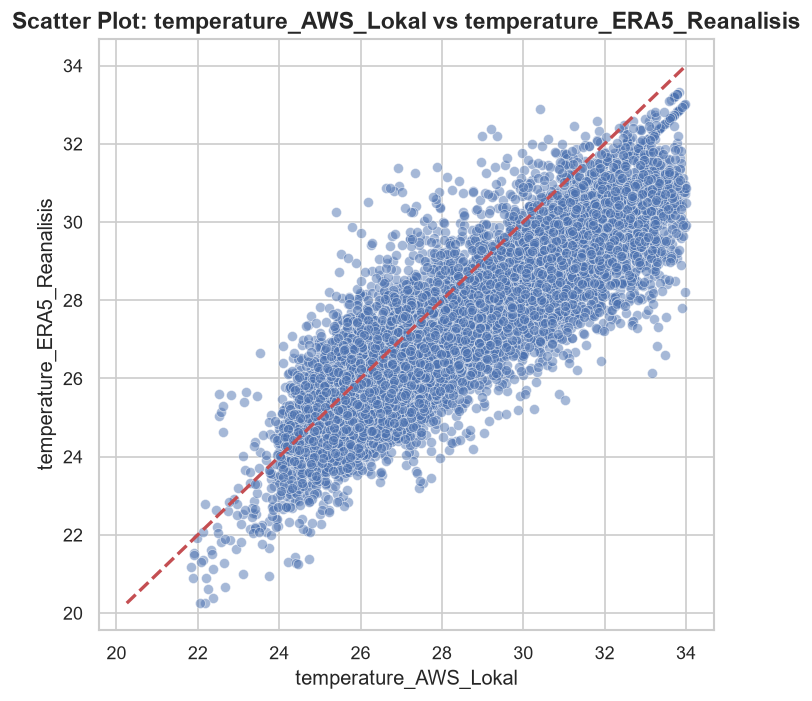

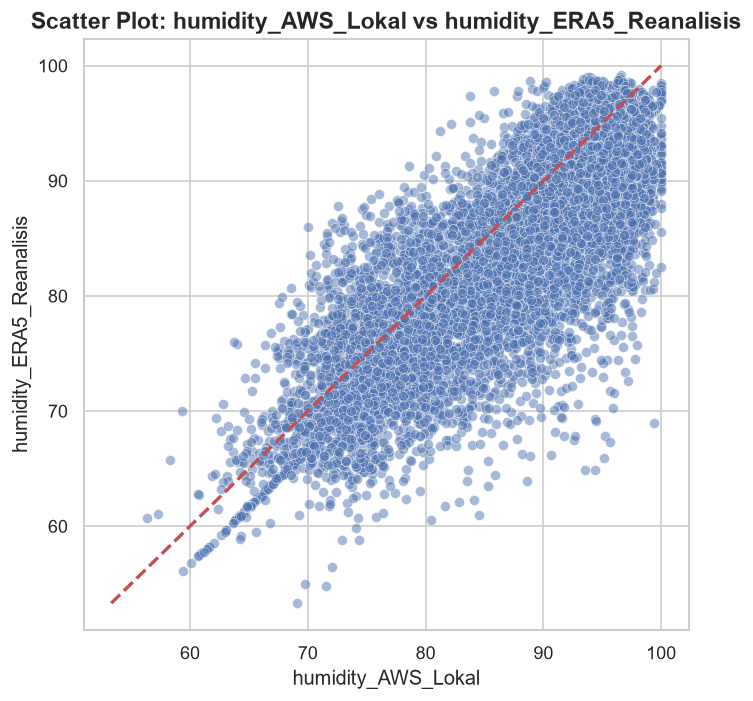

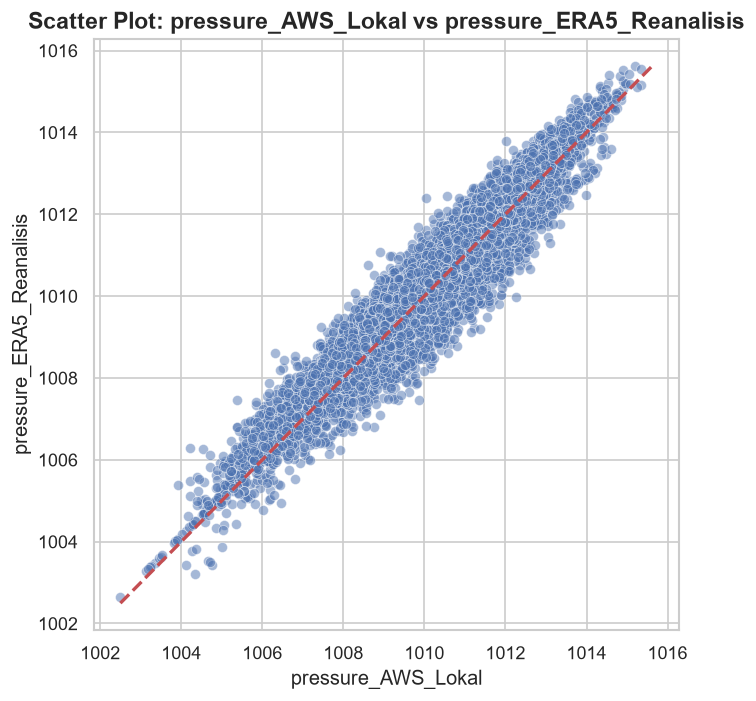

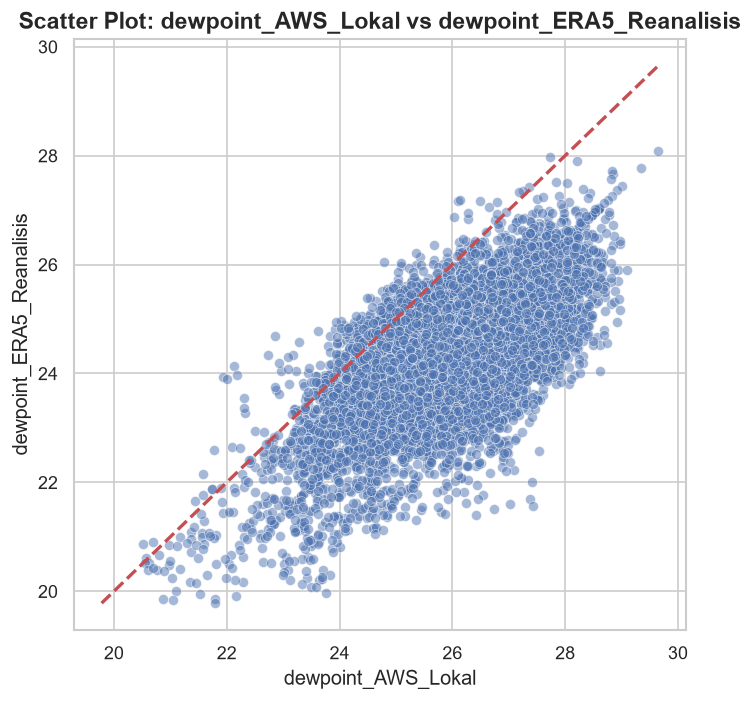

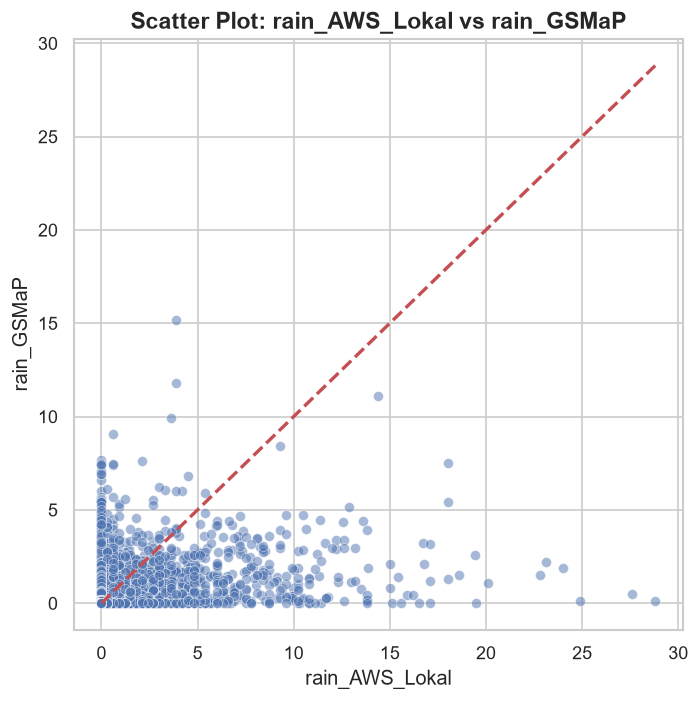

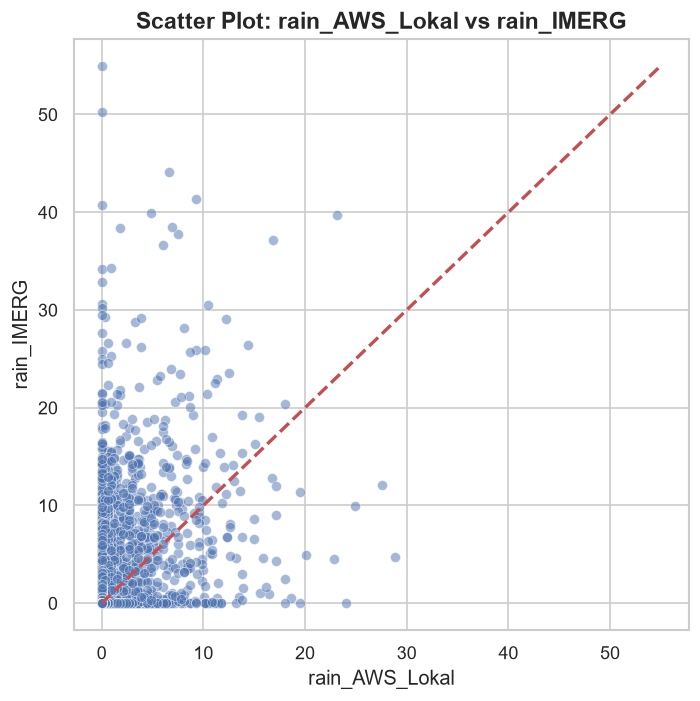

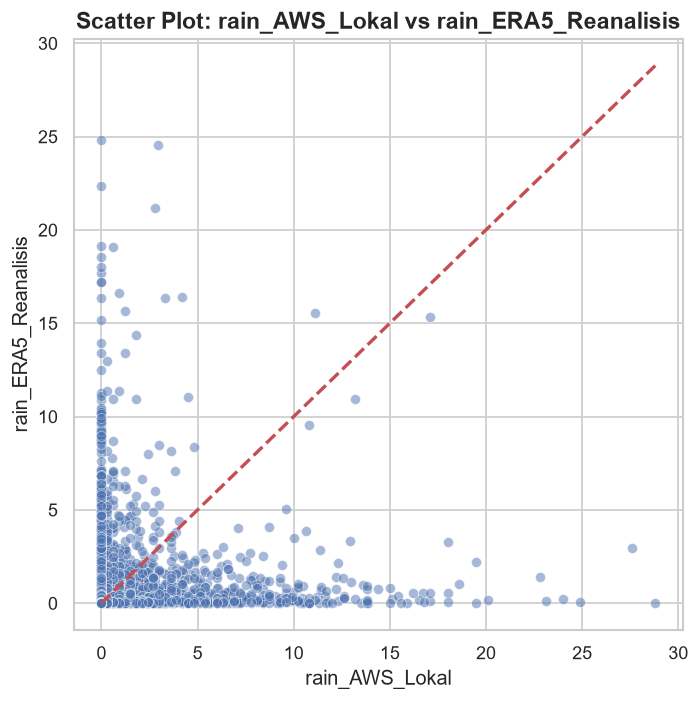

In [11]:
# Sel 9.5: Scatter Plots vs Sensor IoT
for var in var_types:
    var_cols = [c for c in df_merged.columns if c.startswith(f'{var}_')]
    if len(var_cols) < 2: continue
    
    iot_col = None
    for cand in [f'{var}_AWS_Lokal', f'{var}_IoT_curah_hujan', f'{var}_AWS', f'{var}_IoT']:
        if cand in df_merged.columns:
            iot_col = cand
            break
            
    if iot_col:
        compare_cols = [c for c in var_cols if c != iot_col]
        for col in compare_cols:
            fig, ax = plt.subplots(figsize=(6, 6))
            sns.scatterplot(x=df_merged[iot_col], y=df_merged[col], alpha=0.5, ax=ax)
            
            min_val = min(df_merged[iot_col].min(), df_merged[col].min())
            max_val = max(df_merged[iot_col].max(), df_merged[col].max())
            ax.plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2.0)
            
            ax.set_title(f'Scatter Plot: {iot_col} vs {col}', fontsize=14, fontweight='bold')
            ax.set_xlabel(iot_col, fontsize=12)
            ax.set_ylabel(col, fontsize=12)
            plt.tight_layout()
            if 'out_dir' in locals():
                plt.savefig(os.path.join(out_dir, f'scatter_vs_iot_{var}_{col}.png'), dpi=150, bbox_inches='tight')
            plt.show()
            plt.close(fig)


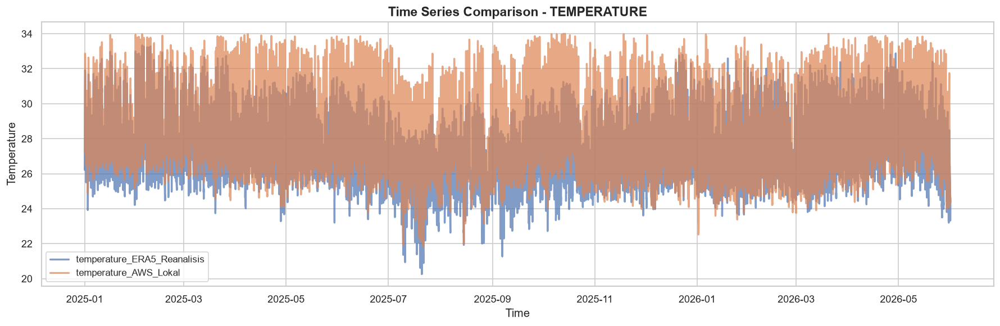

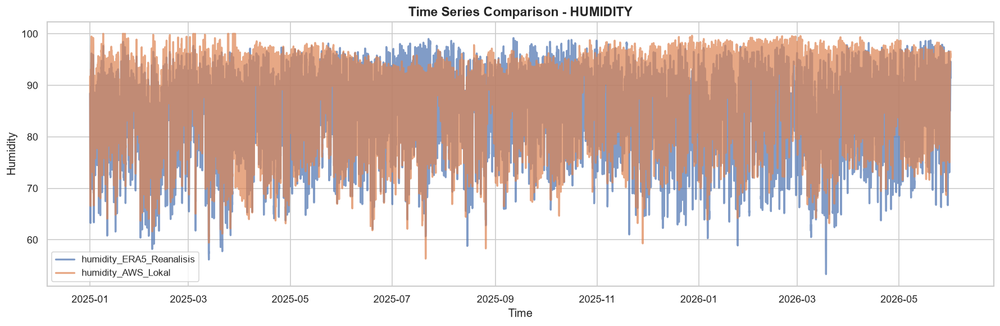

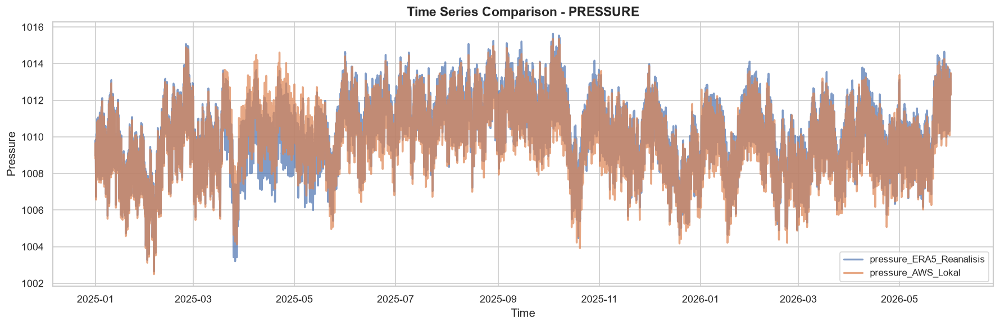

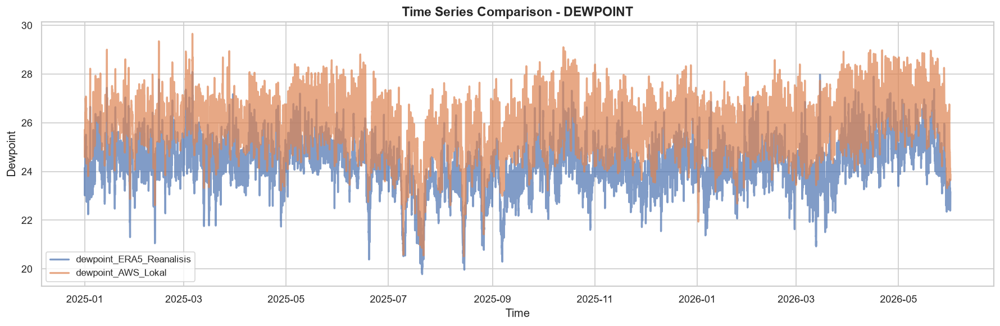

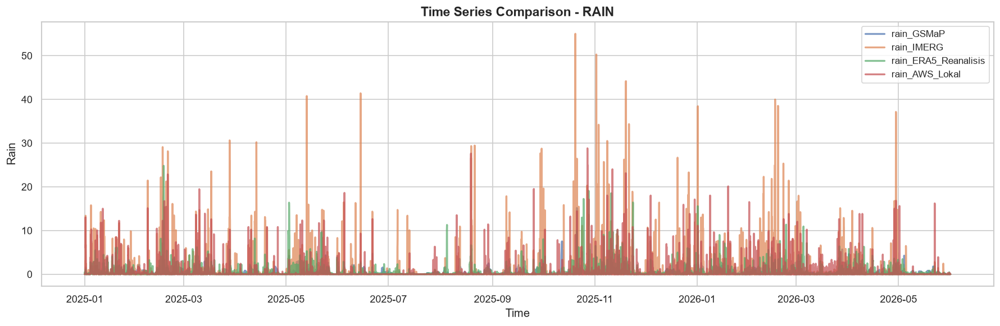

In [12]:
# Sel 9.6: Perbandingan Time Series
for var in var_types:
    var_cols = [c for c in df_merged.columns if c.startswith(f'{var}_')]
    if len(var_cols) < 2: continue
    
    fig, ax = plt.subplots(figsize=(15, 5))
    for col in var_cols:
        ax.plot(df_merged.index, df_merged[col], label=col, alpha=0.7, linewidth=2.0)
    ax.set_title(f'Time Series Comparison - {var.upper()}', fontsize=14, fontweight='bold')
    ax.set_xlabel('Time', fontsize=12)
    ax.set_ylabel(var.capitalize(), fontsize=12)
    ax.legend(fontsize=10)
    plt.tight_layout()
    if 'out_dir' in locals():
        plt.savefig(os.path.join(out_dir, f'timeseries_{var}.png'), dpi=150, bbox_inches='tight')
    plt.show()
    plt.close(fig)


<IPython.core.display.Markdown object>


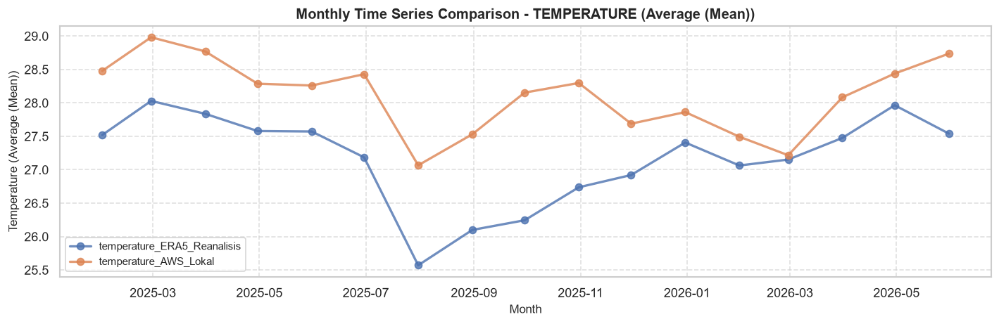

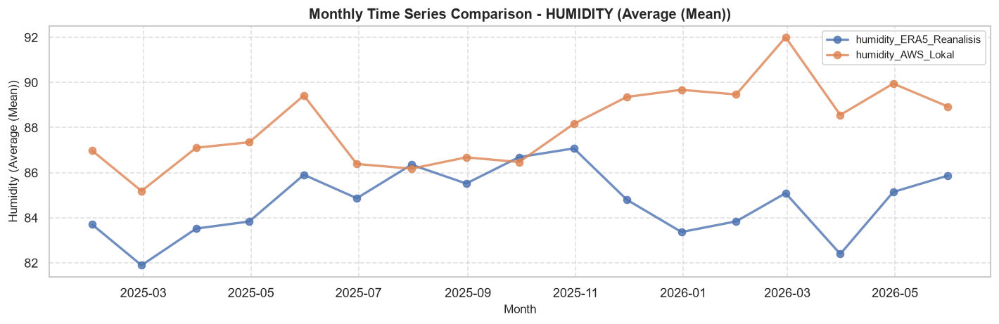

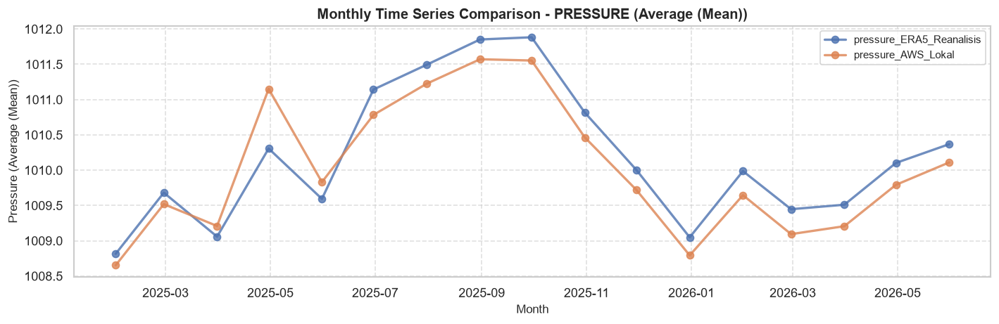

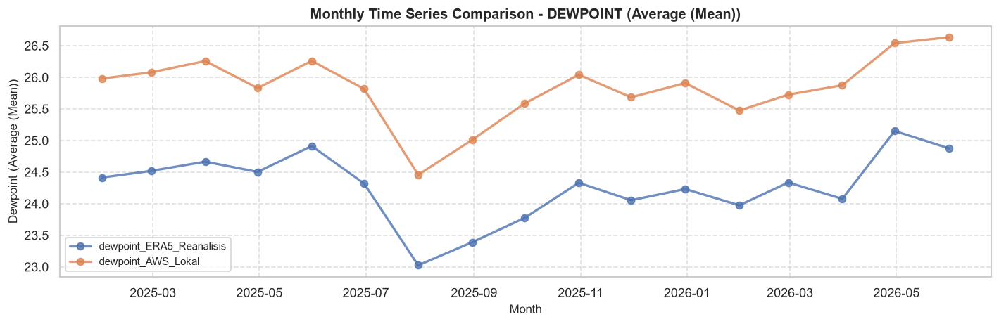

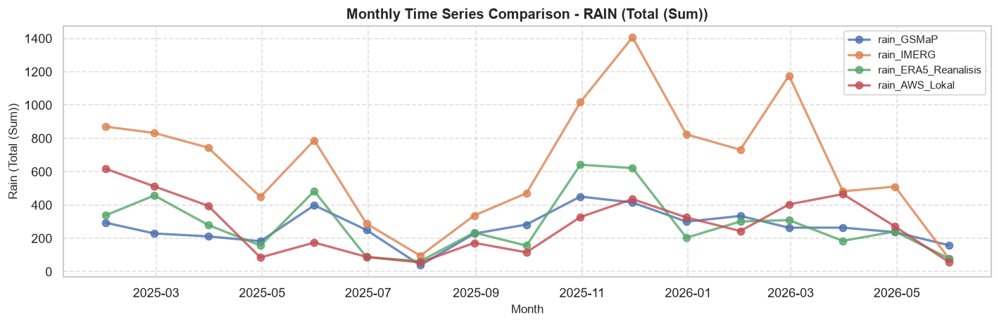

...

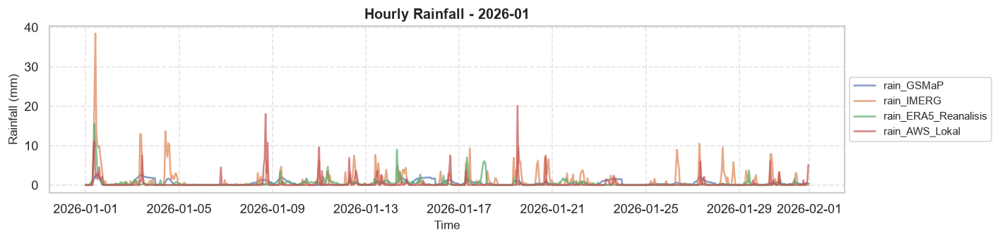

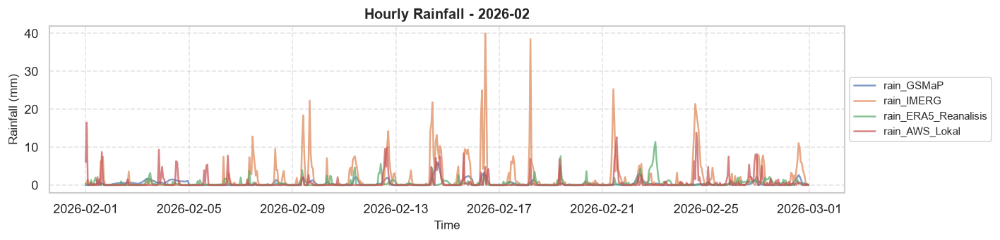

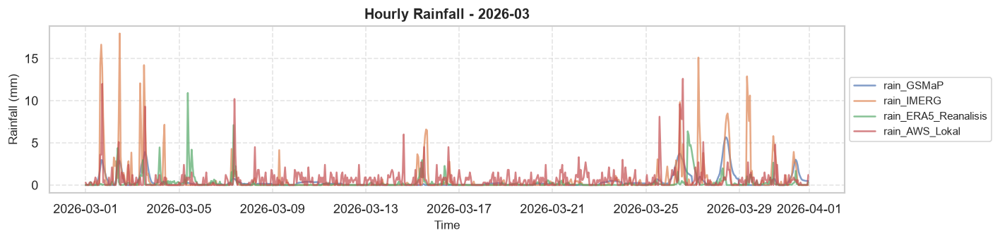

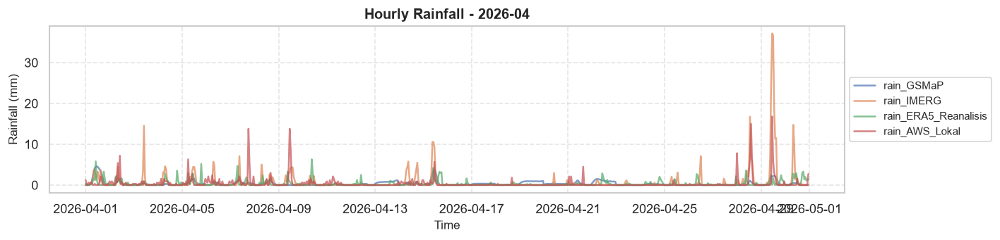

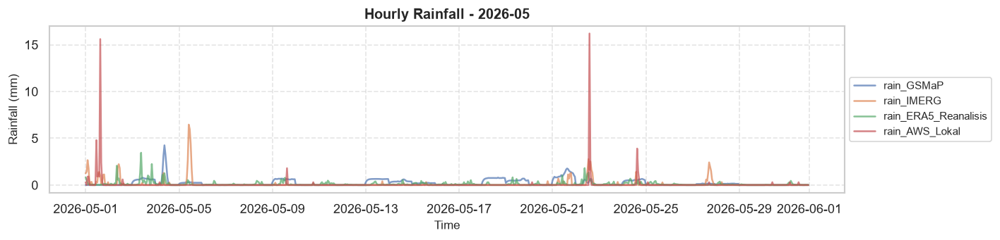

In [13]:
# Sel 9.7: Perbandingan Bulanan Time Series & Hourly Rainfall per Month
for var in var_types:
    var_cols = [c for c in df_merged.columns if c.startswith(f'{var}_')]
    if len(var_cols) < 2: continue
    
    fig, ax = plt.subplots(figsize=(12, 4))
    if var == 'rain':
        df_monthly = df_merged[var_cols].resample('ME').sum()
        agg_label = 'Total (Sum)'
    else:
        df_monthly = df_merged[var_cols].resample('ME').mean()
        agg_label = 'Average (Mean)'
        
    for col in var_cols:
        ax.plot(df_monthly.index, df_monthly[col], marker='o', label=col, alpha=0.8, linewidth=2.0)
    ax.set_title(f'Monthly Time Series Comparison - {var.upper()} ({agg_label})', fontsize=12, fontweight='bold')
    ax.set_xlabel('Month', fontsize=10)
    ax.set_ylabel(f"{var.capitalize()} ({agg_label})", fontsize=10)
    ax.legend(fontsize=9)
    ax.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    if 'out_dir' in locals():
        plt.savefig(os.path.join(out_dir, f'timeseries_monthly_{var}.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close(fig)
    
    # 7. Rain: Monthly Subplots (Hourly resolution, split by month)
    if var == 'rain':
        display(Markdown("#### Hourly Time Series per Month (Rainfall only)"))
        groups = df_merged[var_cols].groupby(df_merged.index.to_period('M'))
        
        for m, df_m in groups:
            if df_m.dropna(how='all').empty: continue
            
            fig_m, ax_m = plt.subplots(figsize=(12, 3))
            for col in var_cols:
                valid_data = df_m[col].dropna()
                if not valid_data.empty:
                    ax_m.plot(valid_data.index, valid_data.values, label=col, alpha=0.7, linewidth=1.5)
            
            ax_m.set_title(f'Hourly Rainfall - {m}', fontsize=12, fontweight='bold')
            ax_m.set_xlabel('Time', fontsize=10)
            ax_m.set_ylabel('Rainfall (mm)', fontsize=10)
            ax_m.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=9)
            ax_m.grid(True, linestyle='--', alpha=0.5)
            plt.tight_layout()
            if 'out_dir' in locals():
                plt.savefig(os.path.join(out_dir, f'hourly_rain_{m}.png'), dpi=300, bbox_inches='tight')
            plt.show()
            plt.close(fig_m)


## 5. Analisis Spesifik Curah Hujan
Analisis korelasi dan sebaran presipitasi membandingkan GPM IMERG, GSMaP, ERA5, dan AWS Lokal.

<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>


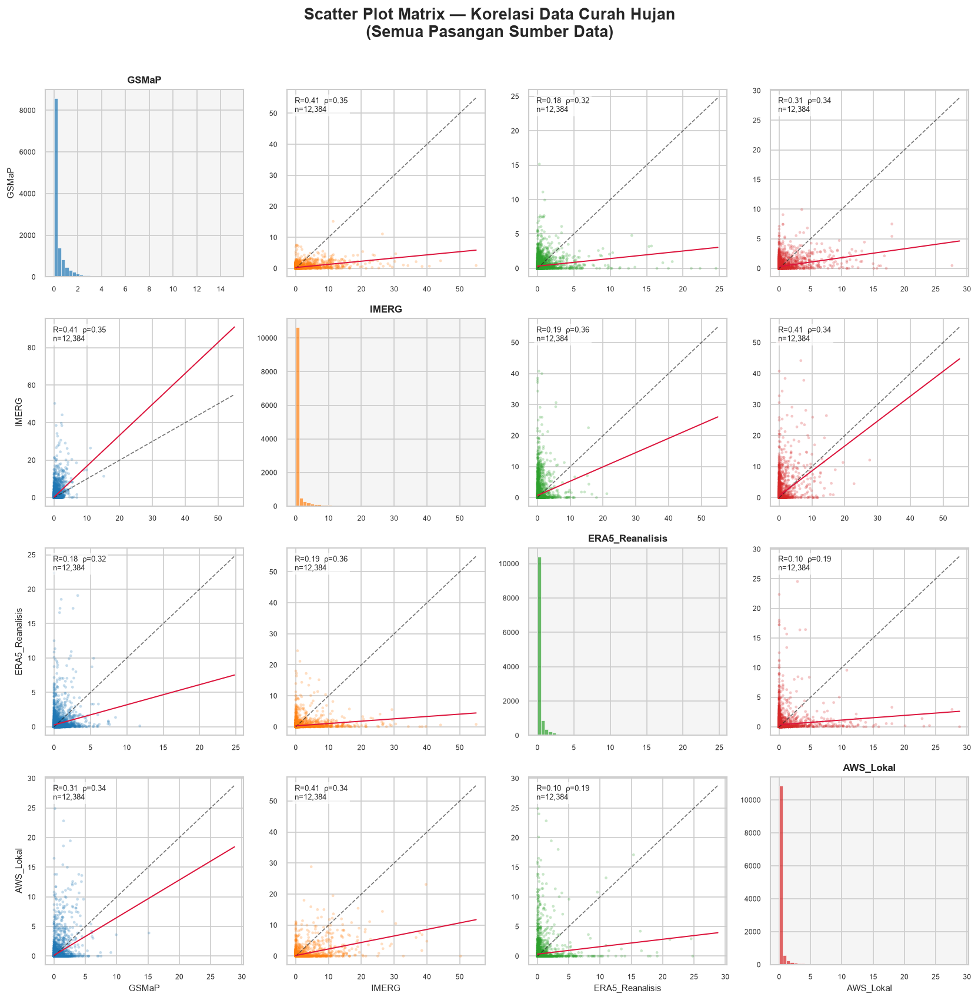

In [15]:
# Sel 11.1: Rain Correlation Setup & Scatter Plot Matrix
rain_cols = [c for c in df_merged.columns if c.startswith('rain_')]
if len(rain_cols) < 2:
    display(Markdown("️ **Tidak cukup kolom curah hujan untuk perbandingan scatterplot.**"))
else:
    short_labels = {c: c.replace('rain_', '') for c in rain_cols}
    df_rain = df_merged[rain_cols].copy()
    df_rain.columns = [short_labels[c] for c in rain_cols]
    n_cols_rain = len(df_rain.columns)
    labels = list(df_rain.columns)
    display(Markdown(
 f"## ️ Analisis Korelasi Scatterplot — Data Curah Hujan\n"
        f"Membandingkan **{n_cols_rain} sumber data curah hujan** secara pairwise:\n" +
        "".join([f"- `{l}`\n" for l in labels])
    ))
    display(Markdown("### 1. Scatter Plot Matrix — Semua Pasangan Sumber Data"))
    cell_size = 3.5
    fig_size = cell_size * n_cols_rain
    fig, axes = plt.subplots(n_cols_rain, n_cols_rain,
                              figsize=(fig_size, fig_size),
                              squeeze=False)
    fig.suptitle('Scatter Plot Matrix — Korelasi Data Curah Hujan\n(Semua Pasangan Sumber Data)',
                 fontsize=16, fontweight='bold', y=1.01)
    COLORS = plt.cm.tab10.colors
    for i, col_y in enumerate(labels):
        for j, col_x in enumerate(labels):
            ax = axes[i][j]
            if i == j:
                # KDE / Histogram
                data_diag = df_rain[col_y].dropna()
                ax.hist(data_diag, bins=50, color=COLORS[i % len(COLORS)],
                        alpha=0.7, edgecolor='white', linewidth=0.5)
                ax.set_facecolor('#f5f5f5')
                ax.set_title(col_y, fontsize=10, fontweight='bold', pad=6)
                ax.set_xlabel('mm/hr', fontsize=8)
                ax.set_ylabel('Freq', fontsize=8)
                ax.tick_params(labelsize=7)
            else:
                mask = df_rain[col_x].notna() & df_rain[col_y].notna()
                x_data = df_rain.loc[mask, col_x]
                y_data = df_rain.loc[mask, col_y]
                if len(x_data) < 5:
                    ax.text(0.5, 0.5, 'N/A', transform=ax.transAxes,
                            ha='center', va='center', fontsize=10, color='gray')
                    ax.set_visible(True)
                    continue
                # Pearson & Spearman
                r_pearson, p_pearson = stats.pearsonr(x_data, y_data)
                r_spearman, _ = stats.spearmanr(x_data, y_data)
                # Scatter
                n_plot = min(len(x_data), 5000)
                idx_sample = np.random.choice(len(x_data), n_plot, replace=False) if len(x_data) > n_plot else np.arange(len(x_data))
                ax.scatter(
                    x_data.iloc[idx_sample],
                    y_data.iloc[idx_sample],
                    alpha=0.25, s=8,
                    color=COLORS[j % len(COLORS)],
                    edgecolors='none'
                )
                # Garis 1:1
                joint_min = max(0, min(x_data.min(), y_data.min()))
                joint_max = max(x_data.max(), y_data.max())
                ax.plot([joint_min, joint_max], [joint_min, joint_max],
                        'k--', linewidth=1.0, alpha=0.6, label='1:1')
                # Garis regresi linear
                slope, intercept, _, _, _ = stats.linregress(x_data, y_data)
                x_line = np.linspace(joint_min, joint_max, 100)
                ax.plot(x_line, slope * x_line + intercept,
                        color='crimson', linewidth=1.2, label='OLS')
                # Annotasi R dan ρ
                txt = f"R={r_pearson:.2f}  ρ={r_spearman:.2f}\nn={len(x_data):,}"
                ax.text(0.04, 0.96, txt, transform=ax.transAxes,
                        fontsize=7.5, va='top', ha='left',
                        bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.3'))
                ax.tick_params(labelsize=7)
            if i == n_cols_rain - 1:
                ax.set_xlabel(labels[j], fontsize=9, labelpad=4)
            else:
                ax.set_xlabel('')
            if j == 0:
                ax.set_ylabel(labels[i], fontsize=9, labelpad=4)
            else:
                ax.set_ylabel('')
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, 'rain_scatterplot_matrix.png'), dpi=300, bbox_inches='tight')
    plt.show()


<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>


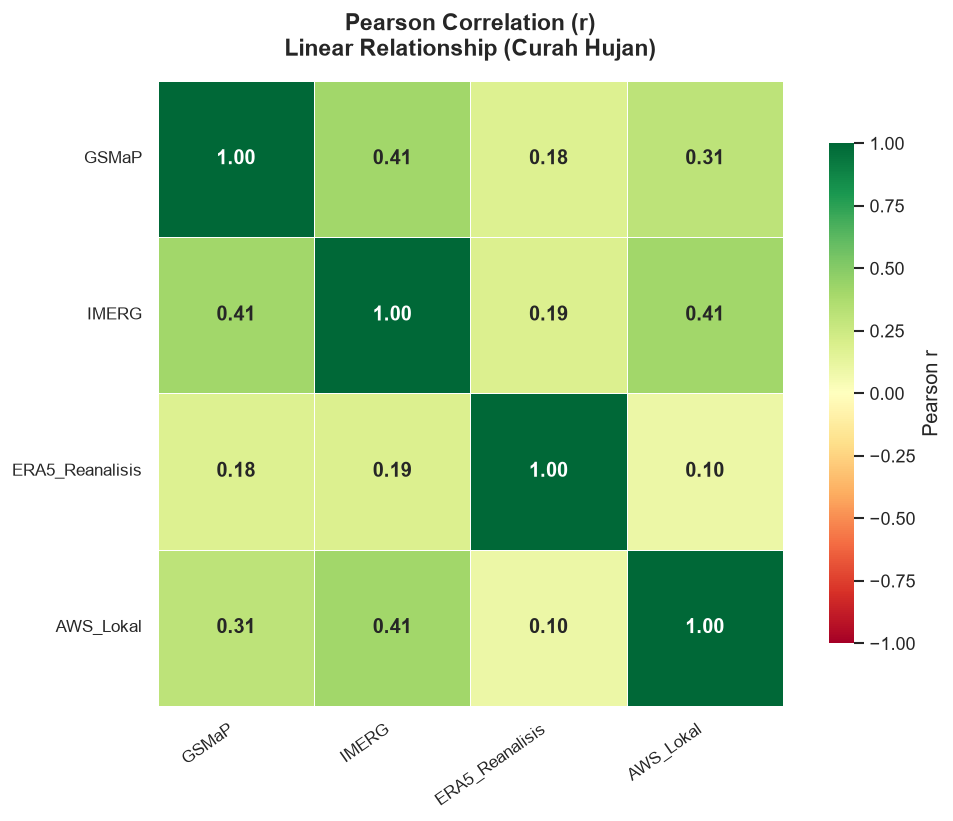

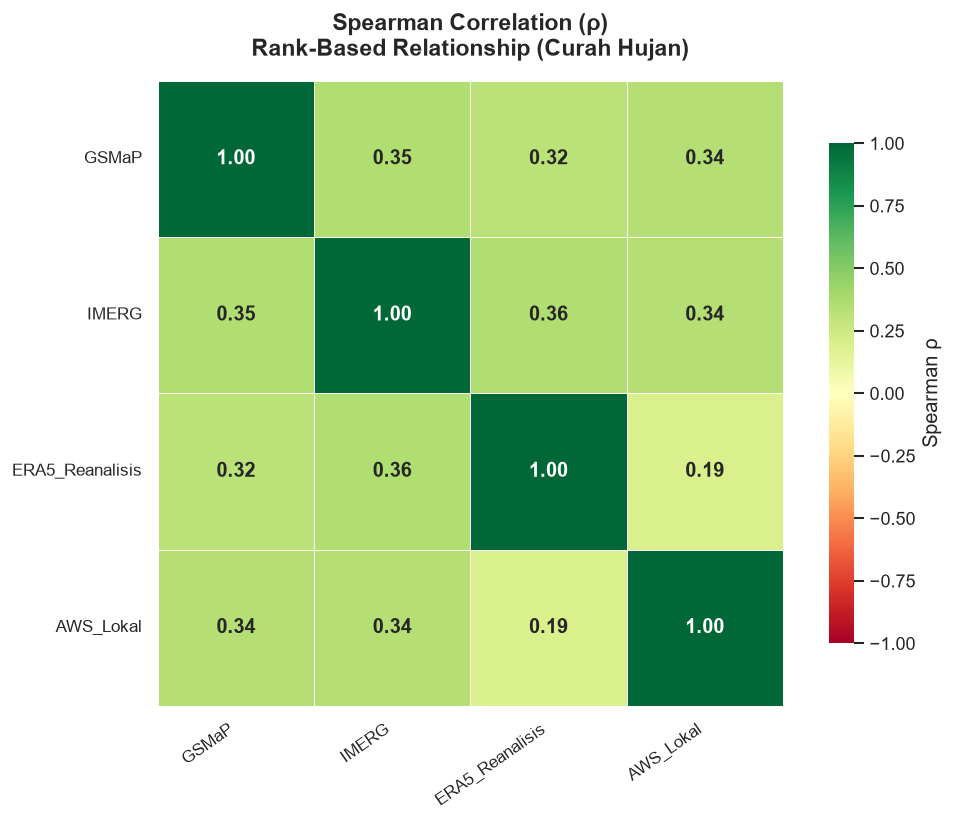

In [16]:
# Sel 11.3: Heatmap Korelasi Pearson & Spearman Curah Hujan
if 'df_rain' in locals() and not df_rain.empty:
    corr_p = df_rain.corr(method='pearson').round(3)
    corr_s = df_rain.corr(method='spearman').round(3)
    
    # 1. Heatmap Korelasi Pearson (Linear Relationship)
    display(Markdown("### 2.1 Heatmap Korelasi Pearson (r) — Curah Hujan"))
    plt.figure(figsize=(9, 7))
    sns.heatmap(corr_p, annot=True, fmt='.2f', cmap='RdYlGn',
                vmin=-1, vmax=1, square=True,
                linewidths=0.5, linecolor='white',
                annot_kws={'size': 12, 'weight': 'bold'},
                cbar_kws={'label': 'Pearson r', 'shrink': 0.8})
    plt.title('Pearson Correlation (r)\nLinear Relationship (Curah Hujan)', fontsize=14, fontweight='bold', pad=15)
    plt.xticks(rotation=35, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    if 'out_dir' in locals():
        plt.savefig(os.path.join(out_dir, 'rain_correlation_pearson_heatmap.png'), dpi=300, bbox_inches='tight')
    plt.show()

    # 2. Heatmap Korelasi Spearman (Rank-Based Monotonic Relationship)
    display(Markdown("### 2.2 Heatmap Korelasi Spearman (ρ) — Curah Hujan"))
    plt.figure(figsize=(9, 7))
    sns.heatmap(corr_s, annot=True, fmt='.2f', cmap='RdYlGn',
                vmin=-1, vmax=1, square=True,
                linewidths=0.5, linecolor='white',
                annot_kws={'size': 12, 'weight': 'bold'},
                cbar_kws={'label': 'Spearman ρ', 'shrink': 0.8})
    plt.title('Spearman Correlation (ρ)\nRank-Based Relationship (Curah Hujan)', fontsize=14, fontweight='bold', pad=15)
    plt.xticks(rotation=35, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    if 'out_dir' in locals():
        plt.savefig(os.path.join(out_dir, 'rain_correlation_spearman_heatmap.png'), dpi=300, bbox_inches='tight')
    plt.show()


<IPython.core.display.Markdown object>


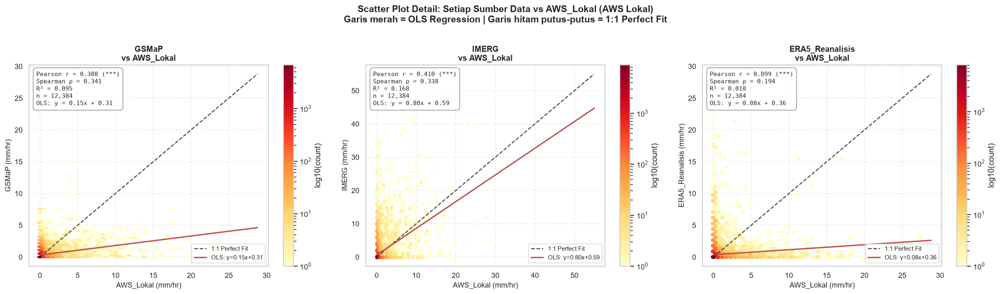

In [17]:
# Sel 11.4: Scatter Plot Detail vs AWS Lokal
if 'df_rain' in locals() and not df_rain.empty:
    display(Markdown("### 3. Scatter Plot Detail — Setiap Sumber Satelit vs Stasiun AWS Lokal"))
    
    # Cari kolom AWS / IoT lokal
    aws_col = None
    for cand in ['AWS_Lokal', 'IoT', 'AWS', 'Lokal']:
        for lbl in labels:
            if cand.lower() in lbl.lower():
                aws_col = lbl
                break
        if aws_col:
            break
    if aws_col is None:
        display(Markdown("ℹ️ Tidak ada kolom AWS Lokal yang terdeteksi."))
    else:
        compare_labels = [l for l in labels if l != aws_col]
        n_compare = len(compare_labels)
        if n_compare > 0:
            ncols_sub = min(3, n_compare)
            nrows_sub = int(np.ceil(n_compare / ncols_sub))
            fig3, axes3 = plt.subplots(nrows_sub, ncols_sub,
                                        figsize=(7 * ncols_sub, 6 * nrows_sub),
                                        squeeze=False)
            fig3.suptitle(f'Scatter Plot Detail: Setiap Sumber Data vs {aws_col} (AWS Lokal)\n' 
                           f'Garis merah = OLS Regression | Garis hitam putus-putus = 1:1 Perfect Fit',
                           fontsize=14, fontweight='bold', y=1.01)
            for idx, sat_col in enumerate(compare_labels):
                row_idx = idx // ncols_sub
                col_idx = idx % ncols_sub
                ax3 = axes3[row_idx][col_idx]
                mask = df_rain[aws_col].notna() & df_rain[sat_col].notna()
                x_aws = df_rain.loc[mask, aws_col]
                y_sat = df_rain.loc[mask, sat_col]
                if len(x_aws) < 5:
                    ax3.text(0.5, 0.5, 'Tidak cukup data', transform=ax3.transAxes,
                             ha='center', va='center', fontsize=11, color='gray')
                    ax3.set_title(sat_col, fontsize=12)
                    continue
                r_p, p_val = stats.pearsonr(x_aws, y_aws := y_sat)
                r_s, _ = stats.spearmanr(x_aws, y_sat)
                slope, intercept, r_value, p_value, std_err = stats.linregress(x_aws, y_sat)
                r2 = r_value ** 2
                # Subsample besar
                n_plot = min(len(x_aws), 8000)
                idx_s = np.random.choice(len(x_aws), n_plot, replace=False) if len(x_aws) > n_plot else np.arange(len(x_aws))
                # hexbin
                hb = ax3.hexbin(x_aws.values, y_sat.values,
                                 gridsize=50, cmap='YlOrRd', mincnt=1, bins='log')
                plt.colorbar(hb, ax=ax3, label='log10(count)')
                # Garis 1:1
                jmin = max(0, min(x_aws.min(), y_sat.min()))
                jmax = max(x_aws.max(), y_sat.max())
                ax3.plot([jmin, jmax], [jmin, jmax], 'k--', lw=1.5, alpha=0.8, label='1:1 Perfect Fit')
                # Garis regresi
                x_line3 = np.linspace(jmin, jmax, 200)
                ax3.plot(x_line3, slope * x_line3 + intercept,
                         'r-', lw=2, label=f'OLS: y={slope:.2f}x+{intercept:.2f}')
                # Statistik box
                sig_str = '***' if p_val < 0.001 else ('**' if p_val < 0.01 else ('*' if p_val < 0.05 else 'ns'))
                stats_txt = (
                    f"Pearson r = {r_p:.3f} ({sig_str})\n"
                    f"Spearman ρ = {r_s:.3f}\n"
                    f"R² = {r2:.3f}\n"
                    f"n = {len(x_aws):,}\n"
                    f"OLS: y = {slope:.2f}x + {intercept:.2f}"
                )
                ax3.text(0.03, 0.97, stats_txt, transform=ax3.transAxes,
                         fontsize=9, va='top', ha='left', family='monospace',
                         bbox=dict(facecolor='white', alpha=0.85, edgecolor='gray',
                                   boxstyle='round,pad=0.5'))
                ax3.set_xlabel(f'{aws_col} (mm/hr)', fontsize=11)
                ax3.set_ylabel(f'{sat_col} (mm/hr)', fontsize=11)
                ax3.set_title(f'{sat_col}\nvs {aws_col}', fontsize=12, fontweight='bold')
                ax3.legend(fontsize=9, loc='lower right')
                ax3.grid(True, linestyle='--', alpha=0.4)
            for idx_empty in range(n_compare, nrows_sub * ncols_sub):
                axes3[idx_empty // ncols_sub][idx_empty % ncols_sub].set_visible(False)
            plt.tight_layout()
            plt.savefig(os.path.join(out_dir, 'rain_scatter_details.png'), dpi=300, bbox_inches='tight')
            plt.show()


<IPython.core.display.Markdown object>
                      Pasangan      n  Pearson r  ...  MBE (mm)  MAE (mm)  RMSE (mm)
0                GSMaP ↔ IMERG  12384      0.410  ...     0.530     0.917      2.855
1            IMERG ↔ AWS_Lokal  12384      0.410  ...    -0.513     0.880      2.826
2            GSMaP ↔ AWS_Lokal  12384      0.308  ...     0.017     0.525      1.500
3      IMERG ↔ ERA5_Reanalisis  12384      0.186  ...    -0.506     1.001      3.091
4      GSMaP ↔ ERA5_Reanalisis  12384      0.179  ...     0.024     0.515      1.320
5  ERA5_Reanalisis ↔ AWS_Lokal  12384      0.099  ...    -0.007     0.628      1.879

[6 rows x 9 columns]
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
  Variable    Model/Dataset     MBE  ...  Pearson r  Spearman rho      R2
0     Rain            GSMaP -0.0168  ...     0.3083        0.3408  0.0950
1     Rain            IMERG  0.5134  ...     0.4105        0.3377  0.1685
2     Rain  ERA5_Reanalisis  0.0074  ...    

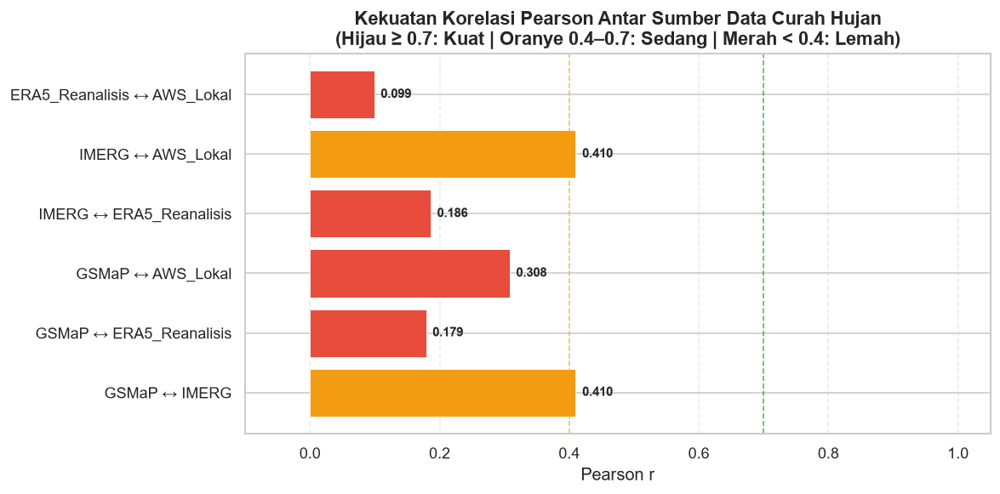

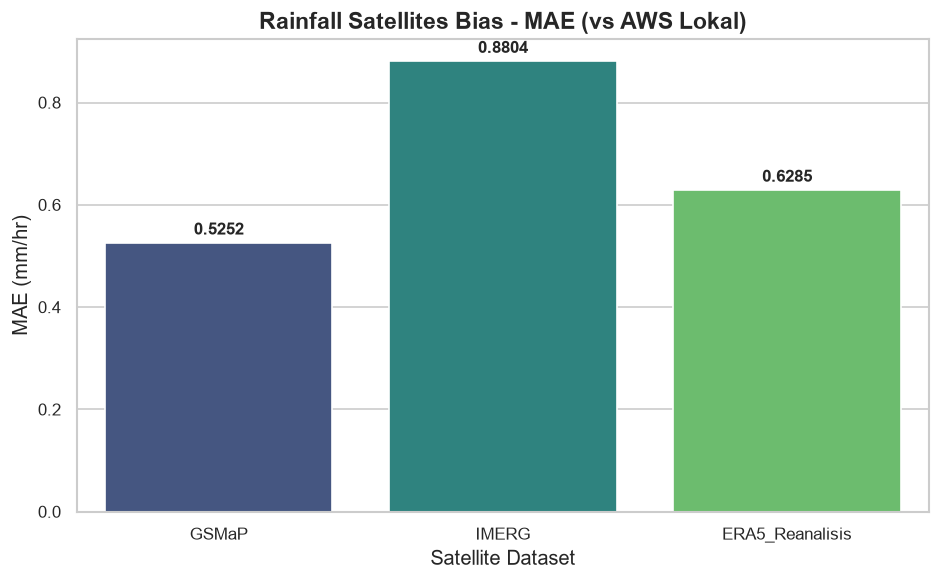

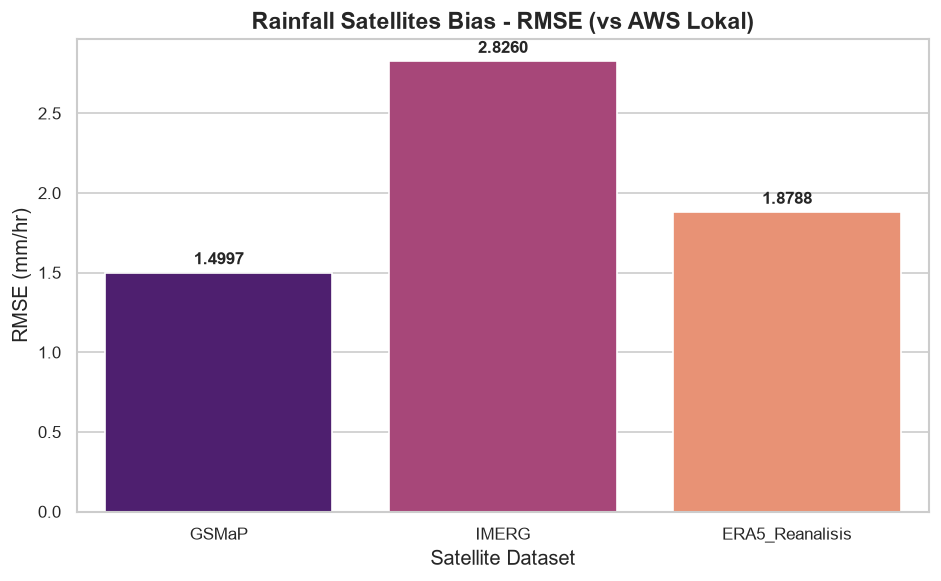

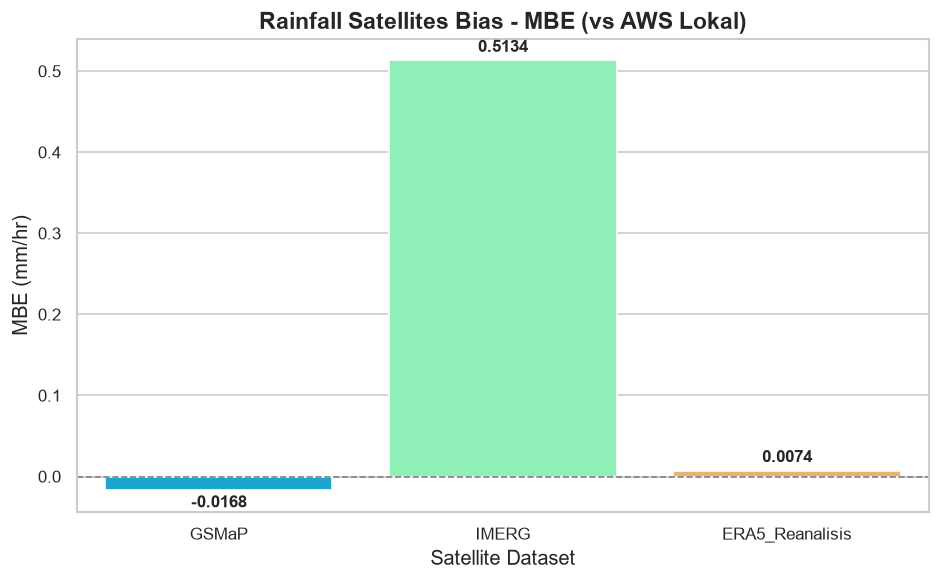

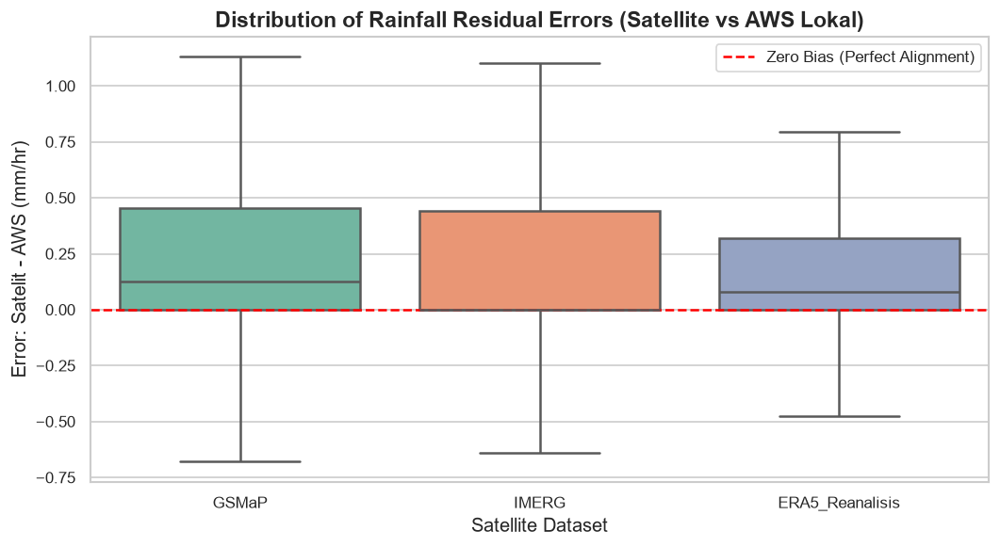

In [18]:
# Sel 11.5: Ringkasan Korelasi & Evaluasi Bias Error vs AWS Lokal (MAE, RMSE, MBE, Boxplot)
if 'df_rain' in locals() and not df_rain.empty:
    display(Markdown("### 4. Ringkasan Statistik Korelasi Pairwise — Curah Hujan"))
    
    summary_rows = []
    for i_l, col_a in enumerate(labels):
        for j_l, col_b in enumerate(labels):
            if j_l <= i_l: continue
            mask = df_rain[col_a].notna() & df_rain[col_b].notna()
            xa = df_rain.loc[mask, col_a]
            xb = df_rain.loc[mask, col_b]
            if len(xa) < 5: continue
            
            r_p2, p_p2 = stats.pearsonr(xa, xb)
            r_s2, p_s2 = stats.spearmanr(xa, xb)
            slope2, intercept2, _, _, _ = stats.linregress(xa, xb)
            mbe2 = float(np.mean(xb - xa))
            mae2 = float(np.mean(np.abs(xb - xa)))
            rmse2 = float(np.sqrt(np.mean((xb - xa)**2)))
            
            summary_rows.append({
                'Pasangan': f'{col_a} ↔ {col_b}',
                'n': len(xa),
                'Pearson r': round(r_p2, 3),
                'Spearman ρ': round(r_s2, 3),
                'R²': round(r_p2**2, 3),
                'OLS slope': round(slope2, 3),
                'MBE (mm)': round(mbe2, 3),
                'MAE (mm)': round(mae2, 3),
                'RMSE (mm)': round(rmse2, 3),
            })
    if summary_rows:
        df_summary_rain = pd.DataFrame(summary_rows)
        display(df_summary_rain.sort_values('Pearson r', ascending=False).reset_index(drop=True))
        
        # Bar chart Pearson r
        fig4, ax4 = plt.subplots(figsize=(max(10, len(summary_rows) * 1.5), 5))
        colors_bar = ['#2ecc71' if r >= 0.7 else '#f39c12' if r >= 0.4 else '#e74c3c'
                      for r in df_summary_rain['Pearson r']]
        bars = ax4.barh(df_summary_rain['Pasangan'], df_summary_rain['Pearson r'],
                         color=colors_bar, edgecolor='white', linewidth=0.5)
        ax4.set_xlabel('Pearson r', fontsize=12)
        ax4.set_title('Kekuatan Korelasi Pearson Antar Sumber Data Curah Hujan\n' 
                       '(Hijau ≥ 0.7: Kuat | Oranye 0.4–0.7: Sedang | Merah < 0.4: Lemah)',
                       fontsize=13, fontweight='bold')
        ax4.set_xlim(-0.1, 1.05)
        ax4.axvline(x=0.7, color='green', linestyle='--', alpha=0.6, linewidth=1)
        ax4.axvline(x=0.4, color='orange', linestyle='--', alpha=0.6, linewidth=1)
        for bar, val in zip(bars, df_summary_rain['Pearson r']):
            ax4.text(val + 0.01, bar.get_y() + bar.get_height()/2,
                     f'{val:.3f}', va='center', ha='left', fontsize=9, fontweight='bold')
        ax4.grid(True, axis='x', linestyle='--', alpha=0.4)
        plt.tight_layout()
        if 'out_dir' in locals():
            plt.savefig(os.path.join(out_dir, 'rain_correlation_bar.png'), dpi=300, bbox_inches='tight')
        plt.show()

# ─── EVALUASI METRIK BIAS ERROR MODEL/SATELIT VS AWS LOKAL ───
sat_cols = [c for c in df_merged.columns if c.startswith('rain_') and c != 'rain_AWS_Lokal']
iot_col = 'rain_AWS_Lokal'

if iot_col in df_merged.columns:
    bias_metrics = []
    for col in sat_cols:
        mask = df_merged[iot_col].notna() & df_merged[col].notna()
        obs = df_merged.loc[mask, iot_col]
        pred = df_merged.loc[mask, col]
        
        if len(obs) > 0:
            mbe = float(np.mean(pred - obs))
            mae = float(np.mean(np.abs(pred - obs)))
            rmse = float(np.sqrt(np.mean((pred - obs)**2)))
            p_corr, _ = stats.pearsonr(obs, pred)
            s_corr, _ = stats.spearmanr(obs, pred)
            r2_general = p_corr ** 2
            
            bias_metrics.append({
                'Variable': 'Rain',
                'Model/Dataset': col.replace('rain_', ''),
                'MBE': mbe,
                'MAE': mae,
                'RMSE': rmse,
                'Pearson r': p_corr,
                'Spearman rho': s_corr,
                'R2': r2_general
            })
            
    if bias_metrics:
        df_bias = pd.DataFrame(bias_metrics)
        display(Markdown("### Analisis Bias Error & Korelasi (Model vs Observasi IoT)"))
        display(Markdown("**MBE (Mean Bias Error)** menunjukkan seberapa meleset data satelit/model secara rata-rata (positif = overestimate, negatif = underestimate). **R2** menggunakan Koefisien Determinasi standar ($r^2$, proporsi variansi terjelaskan)."))
        display(df_bias.round(4))
        if 'out_dir' in locals():
            df_bias.to_csv(os.path.join(out_dir, 'bias_error_metrics.csv'), index=False)
            df_bias.to_csv(os.path.join(out_dir, 'ringkasan_metrik_evaluasi_error_hujan.csv'), index=False)

        # ─── VISUALISASI BIAS UNTUK HUJAN (RAIN) ───
        df_rain_bias = df_bias[df_bias['Variable'] == 'Rain']
        if not df_rain_bias.empty:
            display(Markdown("#### Perbandingan Bias Curah Hujan Satelit vs AWS Lokal"))
            
            # 1. Bar plot MAE (palette='viridis')
            plt.figure(figsize=(8, 5))
            ax1 = sns.barplot(data=df_rain_bias, x='Model/Dataset', y='MAE', hue='Model/Dataset', palette='viridis', legend=False)
            plt.title('Rainfall Satellites Bias - MAE (vs AWS Lokal)', fontsize=14, fontweight='bold')
            plt.xlabel('Satellite Dataset', fontsize=12)
            plt.ylabel('MAE (mm/hr)', fontsize=12)
            plt.xticks(fontsize=10)
            plt.yticks(fontsize=10)
            for container in ax1.containers:
                ax1.bar_label(container, fmt='%.4f', fontsize=10, fontweight='bold', label_type='edge', padding=3)
            plt.tight_layout()
            if 'out_dir' in locals():
                plt.savefig(os.path.join(out_dir, 'rain_bias_mae_vs_aws.png'), dpi=300, bbox_inches='tight')
                plt.savefig(os.path.join(out_dir, 'rain_bias_mae_bar.png'), dpi=300, bbox_inches='tight')
            plt.show()

            # 2. Bar plot RMSE (palette='magma')
            plt.figure(figsize=(8, 5))
            ax2 = sns.barplot(data=df_rain_bias, x='Model/Dataset', y='RMSE', hue='Model/Dataset', palette='magma', legend=False)
            plt.title('Rainfall Satellites Bias - RMSE (vs AWS Lokal)', fontsize=14, fontweight='bold')
            plt.xlabel('Satellite Dataset', fontsize=12)
            plt.ylabel('RMSE (mm/hr)', fontsize=12)
            plt.xticks(fontsize=10)
            plt.yticks(fontsize=10)
            for container in ax2.containers:
                ax2.bar_label(container, fmt='%.4f', fontsize=10, fontweight='bold', label_type='edge', padding=3)
            plt.tight_layout()
            if 'out_dir' in locals():
                plt.savefig(os.path.join(out_dir, 'rain_bias_rmse_vs_aws.png'), dpi=300, bbox_inches='tight')
                plt.savefig(os.path.join(out_dir, 'rain_bias_rmse_bar.png'), dpi=300, bbox_inches='tight')
            plt.show()

            # 3. Bar plot MBE (palette='rainbow')
            plt.figure(figsize=(8, 5))
            ax3 = sns.barplot(data=df_rain_bias, x='Model/Dataset', y='MBE', hue='Model/Dataset', palette='rainbow', legend=False)
            plt.title('Rainfall Satellites Bias - MBE (vs AWS Lokal)', fontsize=14, fontweight='bold')
            plt.xlabel('Satellite Dataset', fontsize=12)
            plt.ylabel('MBE (mm/hr)', fontsize=12)
            plt.xticks(fontsize=10)
            plt.yticks(fontsize=10)
            plt.axhline(0, color='gray', linestyle='--', linewidth=1)
            for container in ax3.containers:
                ax3.bar_label(container, fmt='%.4f', fontsize=10, fontweight='bold', label_type='edge', padding=3)
            plt.tight_layout()
            if 'out_dir' in locals():
                plt.savefig(os.path.join(out_dir, 'rain_bias_mbe_vs_aws.png'), dpi=300, bbox_inches='tight')
                plt.savefig(os.path.join(out_dir, 'rain_bias_mbe_bar.png'), dpi=300, bbox_inches='tight')
            plt.show()

            # 4. Boxplot Distribusi Bias Error (Residual Error: Prediksi Satelit - AWS)
            display(Markdown("#### Sebaran Distribusi Residual Error (Satelit vs AWS Lokal)"))
            error_list = []
            mask_wet = df_merged[iot_col] > 0.1
            for col in sat_cols:
                mask_wet = mask_wet | (df_merged[col] > 0.1)
                
            df_wet_events = df_merged[mask_wet]
            
            for col in sat_cols:
                dataset_name = col.replace('rain_', '')
                err = df_wet_events[col] - df_wet_events[iot_col]
                for val in err.dropna():
                    error_list.append({'Model/Dataset': dataset_name, 'Bias Error (mm/hr)': val})
                    
            df_error_dist = pd.DataFrame(error_list)
            
            plt.figure(figsize=(9, 5))
            ax_box = sns.boxplot(
                data=df_error_dist, 
                x='Model/Dataset', 
                y='Bias Error (mm/hr)', 
                hue='Model/Dataset',
                palette='Set2',
                showfliers=False,
                linewidth=1.5
            )
            plt.axhline(0, color='red', linestyle='--', linewidth=1.5, label='Zero Bias (Perfect Alignment)')
            plt.title('Distribution of Rainfall Residual Errors (Satellite vs AWS Lokal)', fontsize=14, fontweight='bold')
            plt.xlabel('Satellite Dataset', fontsize=12)
            plt.ylabel('Error: Satelit - AWS (mm/hr)', fontsize=12)
            plt.xticks(fontsize=10)
            plt.yticks(fontsize=10)
            plt.legend(loc='upper right', fontsize=10)
            plt.tight_layout()
            if 'out_dir' in locals():
                plt.savefig(os.path.join(out_dir, 'rain_bias_error_boxplot.png'), dpi=300, bbox_inches='tight')
            plt.show()


        Dataset  Tidak Hujan (< 0.2 mm/h)  Hujan (>= 0.2 mm/h)
          GSMaP                      7803                 4581
          IMERG                      9355                 3029
ERA5_Reanalisis                      8816                 3568
      AWS_Lokal                     10104                 2280


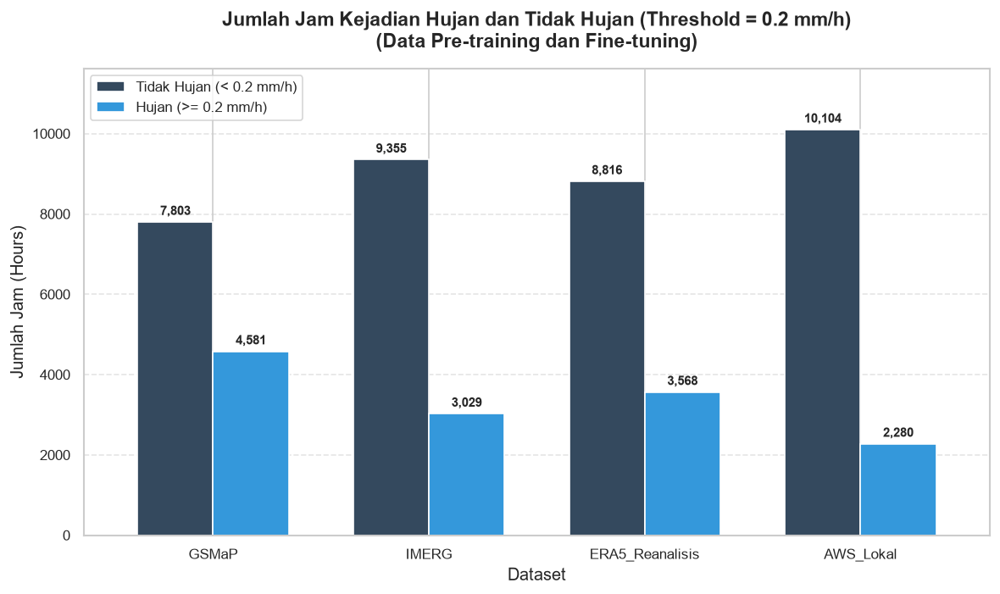

In [19]:
# Sel 11.5: Visualisasi Jumlah Jam Hujan vs Tidak Hujan (Threshold = 0.2 mm/h)
if 'df_rain' in locals():
    
    thresh = 0.2
    
    # Hitung jumlah jam hujan dan tidak hujan
    data_counts = []
    for col in df_rain.columns:
        valid_data = df_rain[col].dropna()
        hujan = int(np.sum(valid_data >= thresh))
        tidak_hujan = int(np.sum(valid_data < thresh))
        data_counts.append({
            'Dataset': col,
            'Tidak Hujan (< 0.2 mm/h)': tidak_hujan,
            'Hujan (>= 0.2 mm/h)': hujan
        })
        
    df_counts = pd.DataFrame(data_counts)
    
    # Print tabel angka secara langsung
    print(df_counts.to_string(index=False))
    
    # Visualisasi Bar Chart Grouped
    df_plot = df_counts.set_index('Dataset')
    ax = df_plot.plot(kind='bar', figsize=(10, 6), color=['#34495e', '#3498db'], width=0.7)
    
    plt.title('Jumlah Jam Kejadian Hujan dan Tidak Hujan (Threshold = 0.2 mm/h)\n' 
              '(Data Pre-training dan Fine-tuning)', fontsize=14, fontweight='bold', pad=15)
    plt.xlabel('Dataset', fontsize=12)
    plt.ylabel('Jumlah Jam (Hours)', fontsize=12)
    plt.xticks(rotation=0, fontsize=10)
    plt.yticks(fontsize=10)
    plt.legend(fontsize=10)
    plt.grid(True, axis='y', linestyle='--', alpha=0.5)
    
    # Tambahkan angka di atas setiap bar
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{int(height):,}',
                    xy=(p.get_x() + p.get_width() / 2, height),
                    xytext=(0, 3), 
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=9, fontweight='bold')
                    
    plt.ylim(0, max(df_counts['Tidak Hujan (< 0.2 mm/h)']) * 1.15)
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, 'rain_threshold_simulation_counts.png'), dpi=300, bbox_inches='tight')
    plt.show()
else:
    print("DataFrame df_rain tidak ditemukan!")


In [20]:
audit_logs = []

missing = df_merged[[col for col in df_merged.columns if col.startswith('rain_')]].isna().sum()
negatives = (df_merged[[col for col in df_merged.columns if col.startswith('rain_')]] < 0).sum()
duplicates = df_merged.index.duplicated().sum()

audit_table = pd.DataFrame({
    'Missing Values': missing,
    'Negative Values': negatives
})

display(Markdown(f"- **Duplicated Timestamps in Aligned Data**: {duplicates}\n"))
display(audit_table)


<IPython.core.display.Markdown object>
                      Missing Values  Negative Values
rain_GSMaP                         0                0
rain_IMERG                         0                0
rain_ERA5_Reanalisis               0                0
rain_AWS_Lokal                     0                0


## 6. Ringkasan Evaluasi & Ekspor Data Hasil Analisis

In [22]:
## 7. Ekspor Data


## 7. Uji Signifikansi Statistik Curah Hujan (Wilcoxon & Mann-Whitney U)

In [24]:
# Sel 11.7: Uji Wilcoxon Signed-Rank & Mann-Whitney U untuk Curah Hujan

# 1. Uji Wilcoxon Signed-Rank (Data Berpasangan/Paired)
# Membandingkan median curah hujan pada jam yang sama (hanya membandingkan jam saat salah satu memiliki hujan > 0.1 mm/jam)
pairs = [
    ('rain_IMERG', 'rain_ERA5_Reanalisis', 'IMERG vs ERA5 Reanalisis'),
    ('rain_GSMaP', 'rain_ERA5_Reanalisis', 'GSMaP vs ERA5 Reanalisis'),
    ('rain_IMERG', 'rain_AWS_Lokal', 'IMERG vs AWS Lokal'),
    ('rain_GSMaP', 'rain_AWS_Lokal', 'GSMaP vs AWS Lokal'),
    ('rain_ERA5_Reanalisis', 'rain_AWS_Lokal', 'ERA5 Reanalisis vs AWS Lokal')
]

wilcoxon_results = []
for col1, col2, label in pairs:
    if col1 in df_merged.columns and col2 in df_merged.columns:
        # Drop NaNs and filter for wet hours
        df_temp = df_merged[[col1, col2]].dropna()
        df_wet = df_temp[(df_temp[col1] > 0.1) | (df_temp[col2] > 0.1)]
        
        if len(df_wet) > 10:
            stat, p_val = stats.wilcoxon(df_wet[col1], df_wet[col2])
            significant = "Ya (p < 0.05)" if p_val < 0.05 else "Tidak (p >= 0.05)"
            wilcoxon_results.append({
                'Perbandingan': label,
                'Jumlah Sampel': len(df_wet),
                'Statistik Uji': round(stat, 2),
                'p-value': f"{p_val:.4e}",
                'Berbeda Nyata?': significant
            })

df_wilcoxon = pd.DataFrame(wilcoxon_results)
display(Markdown("### Hasil Uji Wilcoxon Signed-Rank (Paired)"))
display(df_wilcoxon)

# 2. Uji Mann-Whitney U (Data Tidak Berpasangan/Unpaired)
# Membandingkan distribusi curah hujan antara Musim Hujan (Nov-Apr) vs Musim Kemarau (Mei-Okt)
df_merged['month'] = df_merged.index.month
wet_months = [11, 12, 1, 2, 3, 4]
dry_months = [5, 6, 7, 8, 9, 10]

mw_results = []
datasets = [
    ('rain_IMERG', 'GPM IMERG'),
    ('rain_GSMaP', 'GSMaP'),
    ('rain_ERA5_Reanalisis', 'ERA5 Reanalisis'),
    ('rain_AWS_Lokal', 'AWS Lokal')
]

for col, label in datasets:
    if col in df_merged.columns:
        wet_data = df_merged[df_merged['month'].isin(wet_months)][col].dropna()
        dry_data = df_merged[df_merged['month'].isin(dry_months)][col].dropna()
        
        if len(wet_data) > 10 and len(dry_data) > 10:
            stat, p_val = stats.mannwhitneyu(wet_data, dry_data, alternative='two-sided')
            significant = "Ya (p < 0.05)" if p_val < 0.05 else "Tidak (p >= 0.05)"
            mw_results.append({
                'Dataset': label,
                'Sampel Musim Hujan': len(wet_data),
                'Sampel Musim Kemarau': len(dry_data),
                'Statistik Uji': round(stat, 2),
                'p-value': f"{p_val:.4e}",
                'Perbedaan Signifikan?': significant
            })

df_mw = pd.DataFrame(mw_results)
display(Markdown("### Hasil Uji Mann-Whitney U (Unpaired: Musim Hujan vs Musim Kemarau)"))
display(df_mw)


<IPython.core.display.Markdown object>
                   Perbandingan  Jumlah Sampel  ...      p-value Berbeda Nyata?
0      IMERG vs ERA5 Reanalisis           6242  ...   1.0626e-15  Ya (p < 0.05)
1      GSMaP vs ERA5 Reanalisis           7630  ...   6.3944e-33  Ya (p < 0.05)
2            IMERG vs AWS Lokal           4543  ...  3.1727e-124  Ya (p < 0.05)
3            GSMaP vs AWS Lokal           6258  ...  2.6437e-124  Ya (p < 0.05)
4  ERA5 Reanalisis vs AWS Lokal           6031  ...   2.2488e-48  Ya (p < 0.05)

[5 rows x 5 columns]
<IPython.core.display.Markdown object>
           Dataset  Sampel Musim Hujan  ...      p-value  Perbedaan Signifikan?
0        GPM IMERG                7224  ...  7.2312e-137          Ya (p < 0.05)
1            GSMaP                7224  ...   7.1302e-07          Ya (p < 0.05)
2  ERA5 Reanalisis                7224  ...   1.0168e-24          Ya (p < 0.05)
3        AWS Lokal                7224  ...  1.9617e-199          Ya (p < 0.05)

[4 rows x 6 columns

## 8. Analisis Tren Temporal Suhu & Curah Hujan (2025 - 2026)

<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>


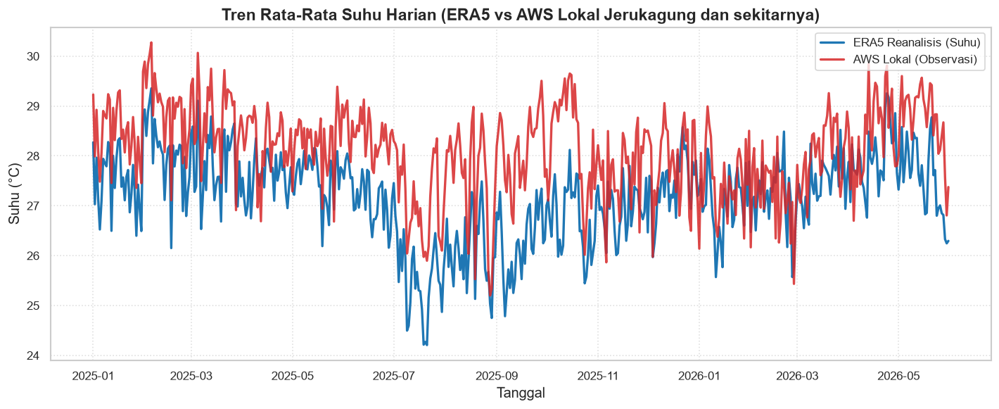

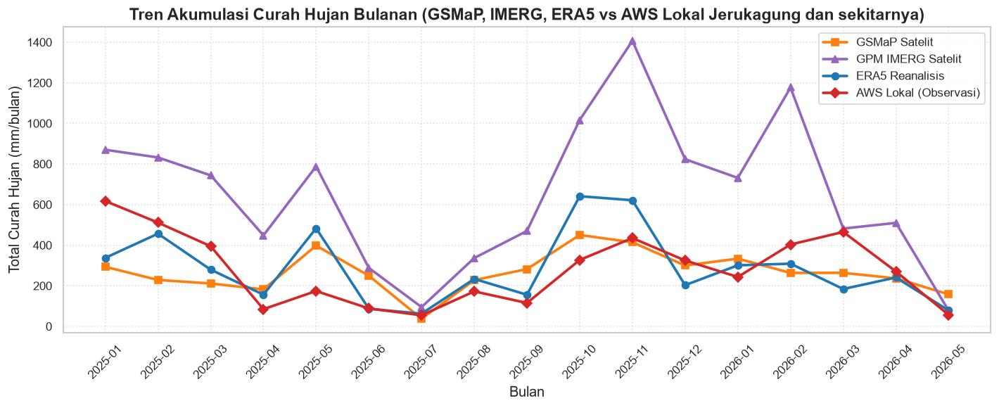

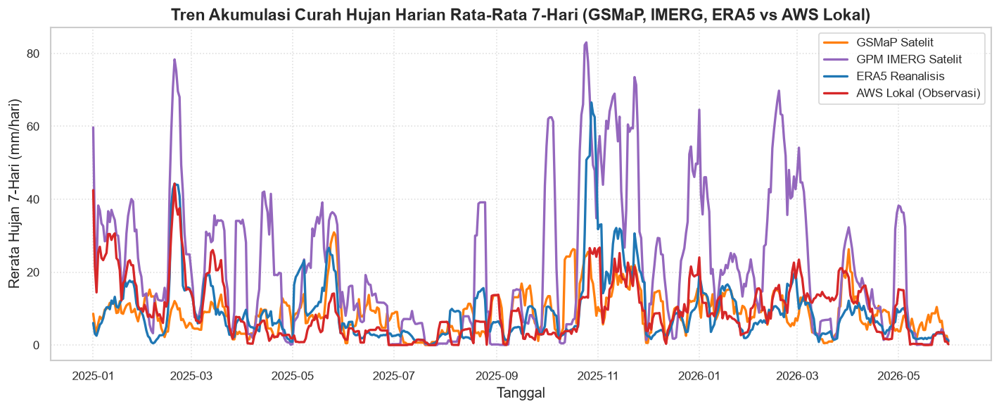

In [26]:
# Sel 11.8: Line Chart Analisis Tren Suhu dan Curah Hujan (ERA5, GSMaP, IMERG, AWS Lokal)

# 1. Tren Rata-Rata Suhu Harian (ERA5 vs AWS Lokal)
temp_cols = [c for c in ['temperature_ERA5_Reanalisis', 'temperature_AWS_Lokal'] if c in df_merged.columns]
if len(temp_cols) > 0:
    df_daily_temp = df_merged[temp_cols].resample('D').mean()
    
    plt.figure(figsize=(12, 5))
    if 'temperature_ERA5_Reanalisis' in df_daily_temp.columns:
        plt.plot(df_daily_temp.index, df_daily_temp['temperature_ERA5_Reanalisis'], label='ERA5 Reanalisis (Suhu)', color='#1f77b4', linewidth=2)
    if 'temperature_AWS_Lokal' in df_daily_temp.columns:
        plt.plot(df_daily_temp.index, df_daily_temp['temperature_AWS_Lokal'], label='AWS Lokal (Observasi)', color='#d62728', linewidth=2, alpha=0.85)
    
    plt.title('Tren Rata-Rata Suhu Harian (ERA5 vs AWS Lokal Jerukagung dan sekitarnya)', fontsize=14, fontweight='bold')
    plt.xlabel('Tanggal', fontsize=12)
    plt.ylabel('Suhu (°C)', fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, 'trend_linechart_temperature_daily.png'), dpi=300, bbox_inches='tight')
    display(Markdown("### 1. Tren Rata-Rata Suhu Harian (ERA5 vs AWS Lokal)"))
    plt.show()

# 2. Tren Akumulasi Curah Hujan Bulanan (GSMaP, IMERG, ERA5 vs AWS Lokal)
rain_cols = ['rain_GSMaP', 'rain_IMERG', 'rain_ERA5_Reanalisis', 'rain_AWS_Lokal']
avail_rain_cols = [c for c in rain_cols if c in df_merged.columns]

if len(avail_rain_cols) > 0:
    df_monthly_rain = df_merged[avail_rain_cols].resample('MS').sum()
    
    colors = {'rain_GSMaP': '#ff7f0e', 'rain_IMERG': '#9467bd', 'rain_ERA5_Reanalisis': '#1f77b4', 'rain_AWS_Lokal': '#d62728'}
    labels = {'rain_GSMaP': 'GSMaP Satelit', 'rain_IMERG': 'GPM IMERG Satelit', 'rain_ERA5_Reanalisis': 'ERA5 Reanalisis', 'rain_AWS_Lokal': 'AWS Lokal (Observasi)'}
    markers = {'rain_GSMaP': 's', 'rain_IMERG': '^', 'rain_ERA5_Reanalisis': 'o', 'rain_AWS_Lokal': 'D'}
    
    plt.figure(figsize=(12, 5))
    for col in avail_rain_cols:
        plt.plot(
            df_monthly_rain.index.strftime('%Y-%m'), 
            df_monthly_rain[col], 
            label=labels.get(col, col), 
            color=colors.get(col, '#333333'), 
            linewidth=2.2, 
            marker=markers.get(col, 'o'),
            markersize=6
        )
    
    plt.title('Tren Akumulasi Curah Hujan Bulanan (GSMaP, IMERG, ERA5 vs AWS Lokal Jerukagung dan sekitarnya)', fontsize=14, fontweight='bold')
    plt.xlabel('Bulan', fontsize=12)
    plt.ylabel('Total Curah Hujan (mm/bulan)', fontsize=12)
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, 'trend_linechart_rainfall_monthly.png'), dpi=300, bbox_inches='tight')
    display(Markdown("### 2. Tren Akumulasi Curah Hujan Bulanan (GSMaP, IMERG, ERA5, AWS Lokal)"))
    plt.show()
    
    # 3. Tren Curah Hujan Rata-Rata 7-Hari (Moving Average)
    df_daily_rain = df_merged[avail_rain_cols].resample('D').sum()
    df_rolling_rain = df_daily_rain.rolling(window=7, min_periods=1).mean()
    
    plt.figure(figsize=(12, 5))
    for col in avail_rain_cols:
        plt.plot(
            df_rolling_rain.index, 
            df_rolling_rain[col], 
            label=labels.get(col, col), 
            color=colors.get(col, '#333333'), 
            linewidth=2.0
        )
    
    plt.title('Tren Akumulasi Curah Hujan Harian Rata-Rata 7-Hari (GSMaP, IMERG, ERA5 vs AWS Lokal)', fontsize=14, fontweight='bold')
    plt.xlabel('Tanggal', fontsize=12)
    plt.ylabel('Rerata Hujan 7-Hari (mm/hari)', fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, 'trend_linechart_rainfall_7day_moving.png'), dpi=300, bbox_inches='tight')
    display(Markdown("### 3. Tren Curah Hujan Rata-Rata 7-Hari (GSMaP, IMERG, ERA5, AWS Lokal)"))
    plt.show()


## 9. Korelasi Fitur Pre-Training ERA5 (Baseline & Hujan GSMaP)

<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>


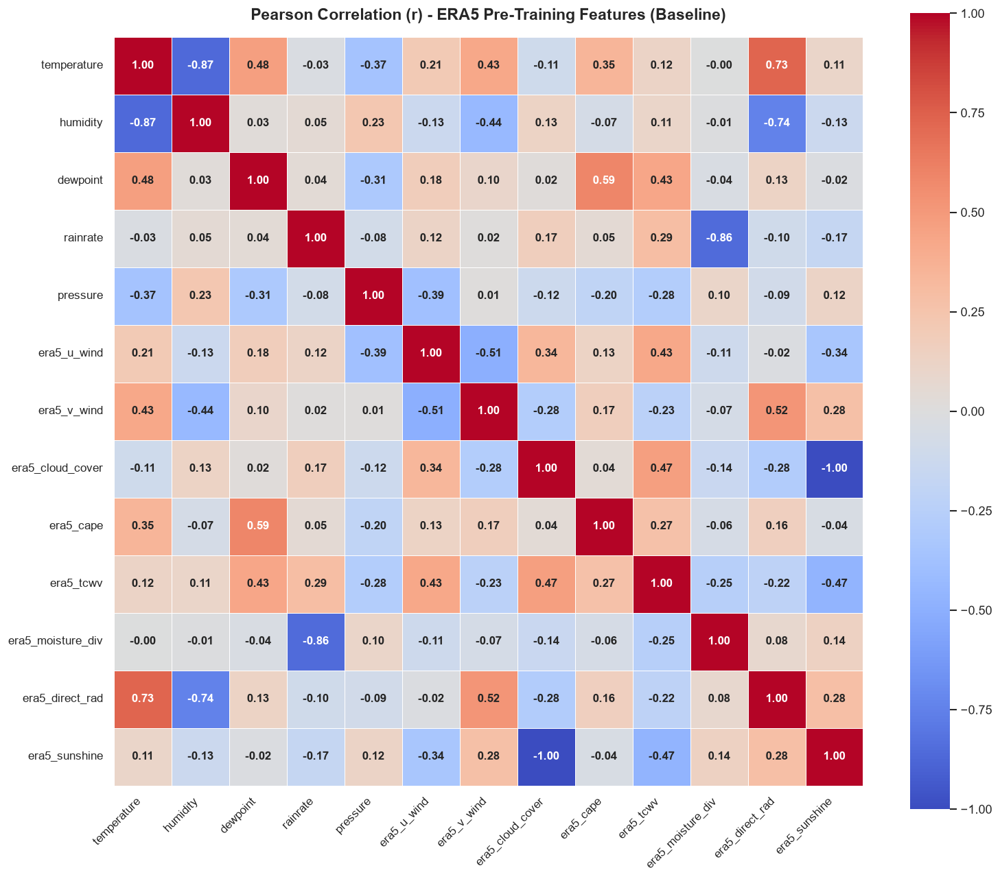

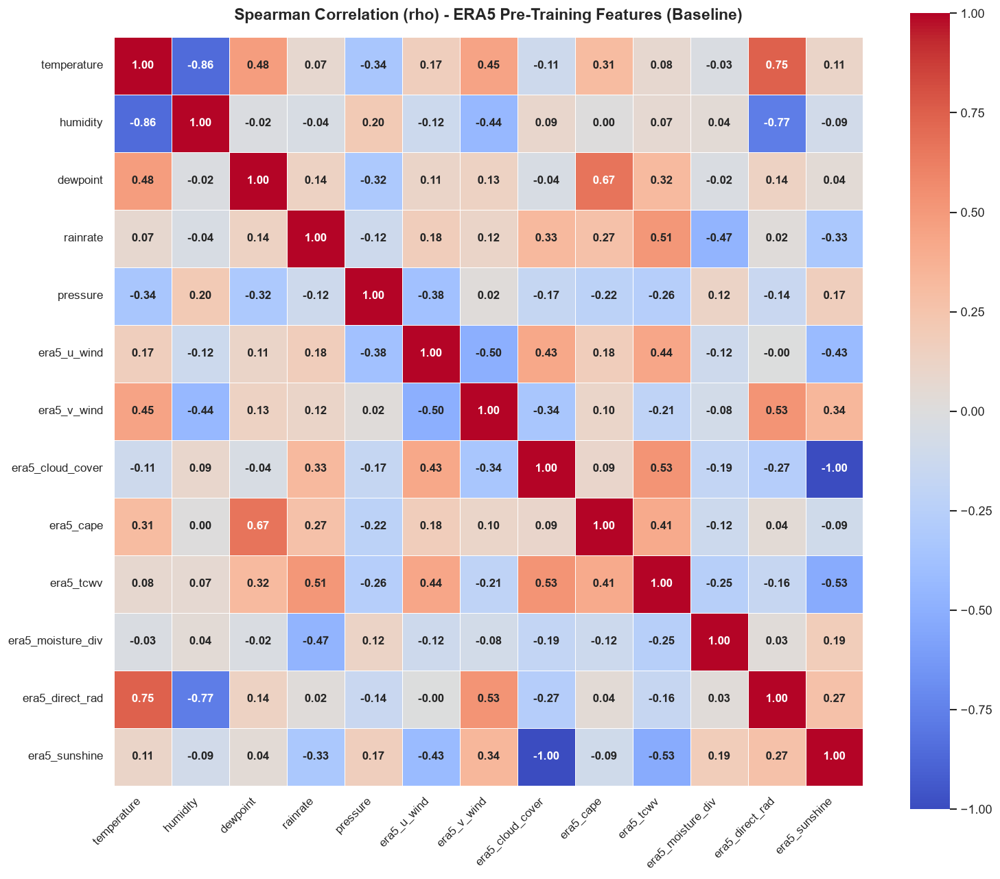

In [28]:
# Sel 12: Analisis Korelasi Pearson & Spearman Fitur Pre-Training ERA5 (Baseline)
PRETRAINING_FEATURES = [
    'temperature', 'humidity', 'dewpoint', 'rainrate', 'pressure',
    'era5_u_wind', 'era5_v_wind', 'era5_cloud_cover', 'era5_cape',
    'era5_tcwv', 'era5_moisture_div', 'era5_direct_rad', 'era5_sunshine'
]

ERA5_FEATURES_MAPPING = {
    'temperature_era5': 'temperature',
    'humidity_era5': 'humidity',
    'dewpoint_era5': 'dewpoint',
    'rain_mm': 'rainrate',
    'sealevel_pressure_era5': 'pressure',
    'u10_era5': 'era5_u_wind',
    'v10_era5': 'era5_v_wind',
    'cloud_cover_era5': 'era5_cloud_cover',
    'cape_era5': 'era5_cape',
    'total_column_water_vapour_era5': 'era5_tcwv',
    'moisture_divergence_era5': 'era5_moisture_div',
    'direct_radiation_era5': 'era5_direct_rad',
    'sunshine_duration_era5': 'era5_sunshine'
}

if 'datasets_raw' in locals() and 'ERA5_Reanalisis' in datasets_raw:
    df_raw = datasets_raw['ERA5_Reanalisis'].copy()
    
    # Parse waktu
    if "datetime_utc" in df_raw.columns:
        df_raw["timestamp"] = pd.to_datetime(df_raw["datetime_utc"], utc=True)
    elif "unixtime" in df_raw.columns:
        df_raw["timestamp"] = pd.to_datetime(df_raw["unixtime"], unit="s", utc=True)
        
    df_raw = df_raw.set_index("timestamp").sort_index()
    
    # Filter sesuai timeline evaluasi
    df_filtered = df_raw[(df_raw.index >= '2025-01-01 00:00:00') & (df_raw.index <= '2026-05-31 23:59:59')].copy()
    
    # Rename jika kolom menggunakan nama mentah GEE
    df_filtered = df_filtered.rename(columns=ERA5_FEATURES_MAPPING)
    
    # Ambil semua fitur pre-training yang ada di DataFrame
    existing_cols = [c for c in PRETRAINING_FEATURES if c in df_filtered.columns]
    df_features = df_filtered[existing_cols].copy()
    
    # Hitung Korelasi
    corr_p_feat = df_features.corr(method='pearson')
    corr_s_feat = df_features.corr(method='spearman')
    
    # 1. Pearson Heatmap
    display(Markdown("### Matriks Korelasi Pearson Fitur Pre-Training ERA5 (Baseline)"))
    plt.figure(figsize=(13, 11))
    sns.heatmap(corr_p_feat, annot=True, fmt='.2f', cmap='coolwarm',
                vmin=-1, vmax=1, square=True, linewidths=0.5, linecolor='white',
                annot_kws={'size': 10, 'weight': 'bold'})
    plt.title('Pearson Correlation (r) - ERA5 Pre-Training Features (Baseline)', fontsize=14, fontweight='bold', pad=15)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    if 'out_dir' in locals():
        plt.savefig(os.path.join(out_dir, 'pretraining_features_pearson_heatmap.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    # 2. Spearman Heatmap
    display(Markdown("### Matriks Korelasi Spearman Fitur Pre-Training ERA5 (Baseline)"))
    plt.figure(figsize=(13, 11))
    sns.heatmap(corr_s_feat, annot=True, fmt='.2f', cmap='coolwarm',
                vmin=-1, vmax=1, square=True, linewidths=0.5, linecolor='white',
                annot_kws={'size': 10, 'weight': 'bold'})
    plt.title('Spearman Correlation (rho) - ERA5 Pre-Training Features (Baseline)', fontsize=14, fontweight='bold', pad=15)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    if 'out_dir' in locals():
        plt.savefig(os.path.join(out_dir, 'pretraining_features_spearman_heatmap.png'), dpi=300, bbox_inches='tight')
    plt.show()
else:
    print("Dataset ERA5_Reanalisis tidak ditemukan di datasets_raw!")


<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>


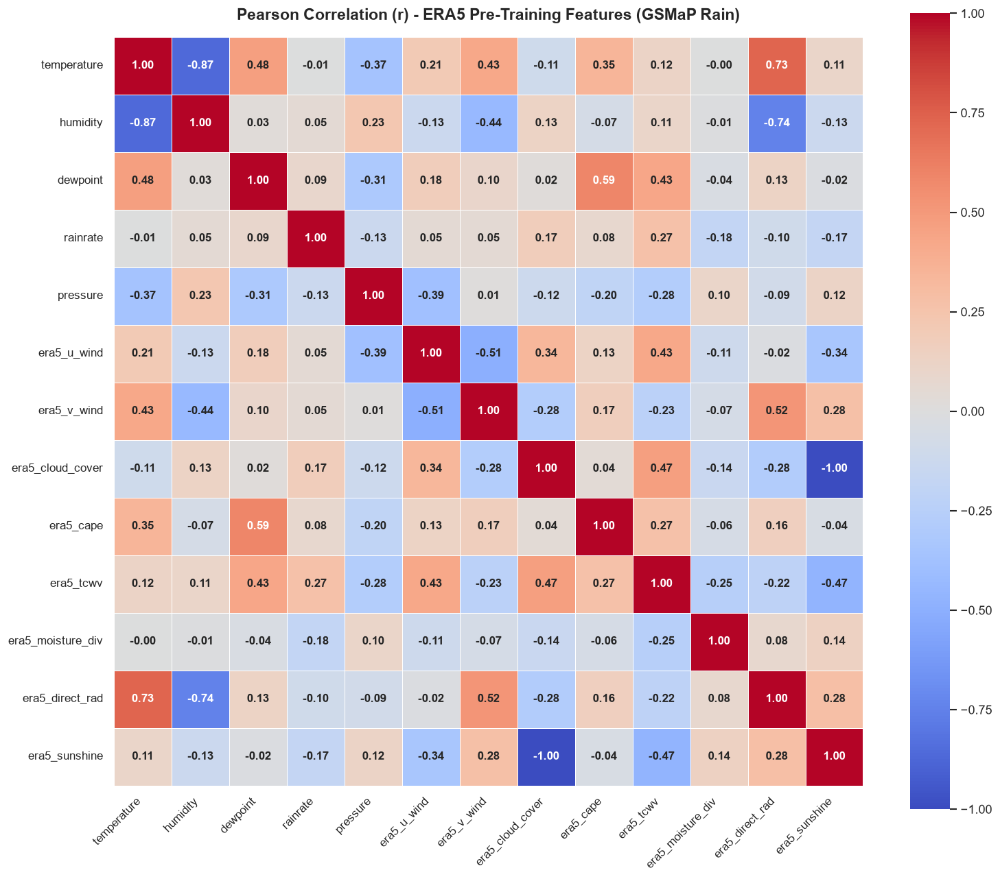

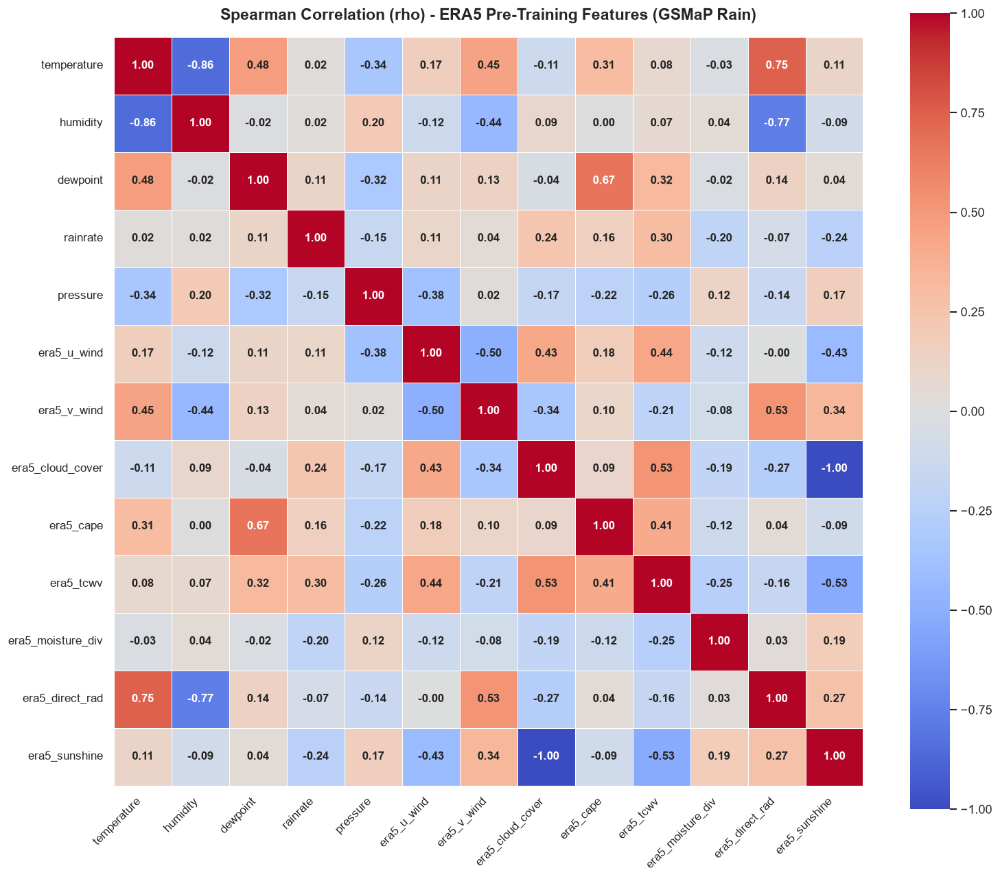

In [29]:
# Sel 14: Analisis Korelasi Pearson & Spearman Fitur Pre-Training ERA5 (Rain diganti GSMaP)
if 'datasets_raw' in locals() and 'ERA5_Reanalisis' in datasets_raw and 'df_merged' in locals():
    df_raw = datasets_raw['ERA5_Reanalisis'].copy()
    
    # Parse waktu
    if "datetime_utc" in df_raw.columns:
        df_raw["timestamp"] = pd.to_datetime(df_raw["datetime_utc"], utc=True)
    elif "unixtime" in df_raw.columns:
        df_raw["timestamp"] = pd.to_datetime(df_raw["unixtime"], unit="s", utc=True)
        
    df_raw = df_raw.set_index("timestamp").sort_index()
    
    # Filter sesuai timeline evaluasi
    df_filtered = df_raw[(df_raw.index >= '2025-01-01 00:00:00') & (df_raw.index <= '2026-05-31 23:59:59')].copy()
    
    # Rename jika kolom menggunakan nama mentah GEE
    df_filtered = df_filtered.rename(columns=ERA5_FEATURES_MAPPING)
    
    # Ambil semua fitur pre-training yang ada di DataFrame
    existing_cols = [c for c in PRETRAINING_FEATURES if c in df_filtered.columns]
    df_features = df_filtered[existing_cols].copy()
    
    # Alinyemen dan ganti kolom rainrate dengan rain_GSMaP dari df_merged
    if 'rain_GSMaP' in df_merged.columns:
        df_features['rainrate'] = df_merged['rain_GSMaP'].reindex(df_features.index)
    
    # Hitung Korelasi
    corr_p_feat = df_features.corr(method='pearson')
    corr_s_feat = df_features.corr(method='spearman')
    
    # 1. Pearson Heatmap
    display(Markdown("### Matriks Korelasi Pearson Fitur Pre-Training ERA5 (Rain diganti GSMaP)"))
    plt.figure(figsize=(13, 11))
    sns.heatmap(corr_p_feat, annot=True, fmt='.2f', cmap='coolwarm',
                vmin=-1, vmax=1, square=True, linewidths=0.5, linecolor='white',
                annot_kws={'size': 10, 'weight': 'bold'})
    plt.title('Pearson Correlation (r) - ERA5 Pre-Training Features (GSMaP Rain)', fontsize=14, fontweight='bold', pad=15)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    if 'out_dir' in locals():
        plt.savefig(os.path.join(out_dir, 'pretraining_features_pearson_heatmap_gsmap_rain.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    # 2. Spearman Heatmap
    display(Markdown("### Matriks Korelasi Spearman Fitur Pre-Training ERA5 (Rain diganti GSMaP)"))
    plt.figure(figsize=(13, 11))
    sns.heatmap(corr_s_feat, annot=True, fmt='.2f', cmap='coolwarm',
                vmin=-1, vmax=1, square=True, linewidths=0.5, linecolor='white',
                annot_kws={'size': 10, 'weight': 'bold'})
    plt.title('Spearman Correlation (rho) - ERA5 Pre-Training Features (GSMaP Rain)', fontsize=14, fontweight='bold', pad=15)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    if 'out_dir' in locals():
        plt.savefig(os.path.join(out_dir, 'pretraining_features_spearman_heatmap_gsmap_rain.png'), dpi=300, bbox_inches='tight')
    plt.show()
else:
    print("Dataset atau df_merged tidak tersedia!")


## 10. Analisis Tren Iklim Jangka Panjang (2005 - 2025)
Analisis tren 21 tahun untuk suhu (ERA5) dan curah hujan (GPM IMERG, GSMaP, ERA5) di Jerukagung dan sekitarnya.

Memuat data jangka panjang 2005 - 2025...


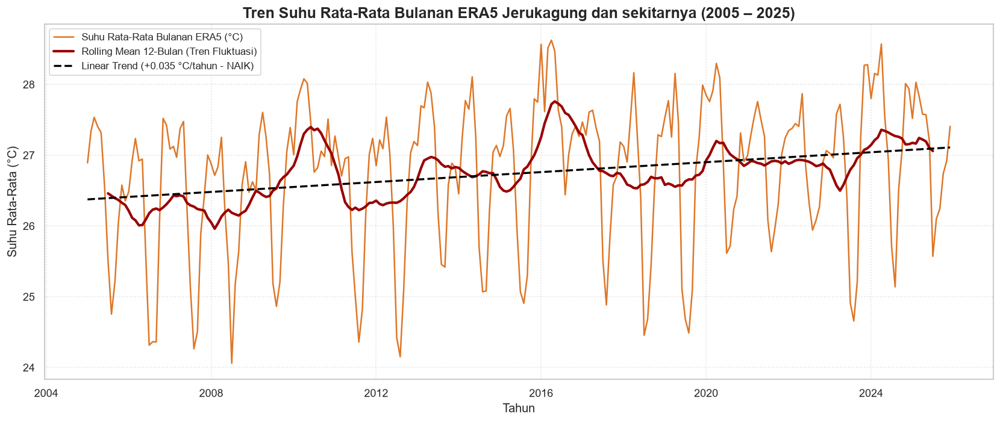

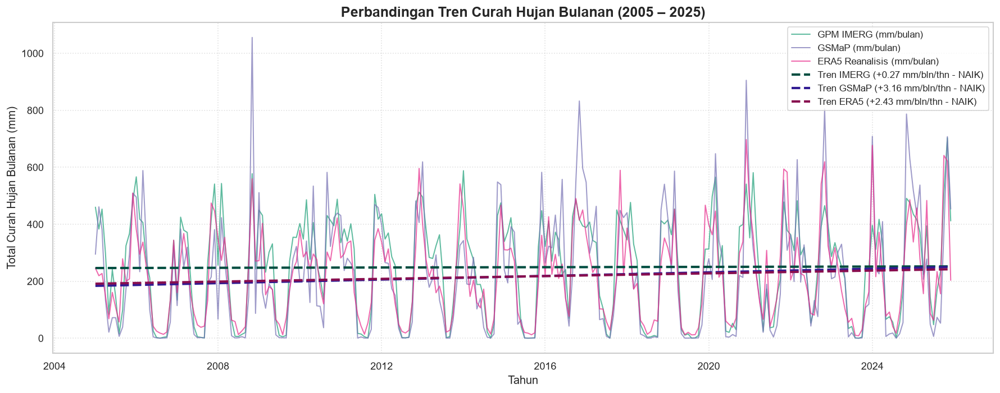

In [31]:
# Sel 15.1: Analisis Linechart Tren Bulanan Suhu & Curah Hujan (2005 - 2025)
base_sat_dir = os.path.join(base_dir, 'Data_Satelit') if 'base_dir' in locals() else 'Google_Earth_Engine/Data_Satelit'
out_dir = os.path.join(base_dir, 'Hasil_Analisis') if 'base_dir' in locals() else 'Google_Earth_Engine/Hasil_Analisis'
os.makedirs(out_dir, exist_ok=True)
# 1. Load Long-Term Datasets (2005 - 2025)
print('Memuat data jangka panjang 2005 - 2025...')
df_era5_lt = pd.read_csv(os.path.join(base_sat_dir, 'ERA5_Hourly_All_Requested_Features_2000_2026.csv'), usecols=['datetime_utc', 'temperature', 'rainrate'])
df_era5_lt['datetime_utc'] = pd.to_datetime(df_era5_lt['datetime_utc'])
df_era5_lt.set_index('datetime_utc', inplace=True)
df_era5_lt = df_era5_lt['2005-01-01':'2025-12-31']
if df_era5_lt['temperature'].mean() > 200:
    df_era5_lt['temperature_C'] = df_era5_lt['temperature'] - 273.15
else:
    df_era5_lt['temperature_C'] = df_era5_lt['temperature']
df_gsmap_lt = pd.read_csv(os.path.join(base_sat_dir, 'Rainfall_GSMap_TimeSeries_UNIX.csv'), usecols=['datetime_utc', 'hourlyPrecipRate'])
df_gsmap_lt['datetime_utc'] = pd.to_datetime(df_gsmap_lt['datetime_utc'])
df_gsmap_lt.set_index('datetime_utc', inplace=True)
df_gsmap_lt = df_gsmap_lt['2005-01-01':'2025-12-31']
df_imerg_lt = pd.read_csv(os.path.join(base_sat_dir, 'Rainfall_IMERG_TimeSeries_UNIX.csv'), usecols=['datetime_utc', 'precipitation'])
df_imerg_lt['datetime_utc'] = pd.to_datetime(df_imerg_lt['datetime_utc'])
df_imerg_lt.set_index('datetime_utc', inplace=True)
df_imerg_lt = df_imerg_lt['2005-01-01':'2025-12-31']
df_imerg_hourly_lt = df_imerg_lt.resample('1h').mean()
# Aggregasi Bulanan (2005 - 2025)
monthly_temp = df_era5_lt['temperature_C'].resample('1MS').mean()
monthly_rain_era5 = df_era5_lt['rainrate'].resample('1MS').sum()
monthly_rain_gsmap = df_gsmap_lt['hourlyPrecipRate'].resample('1MS').sum()
monthly_rain_imerg = df_imerg_hourly_lt['precipitation'].resample('1MS').sum()
# ─── 1. LINECHART TREN SUHU BULANAN (ERA5 2005 - 2025) ───
plt.figure(figsize=(14, 6))
plt.plot(monthly_temp.index, monthly_temp.values, color='#d95f02', linewidth=1.5, label='Suhu Rata-Rata Bulanan ERA5 (°C)', alpha=0.85)
plt.plot(monthly_temp.index, monthly_temp.rolling(12, center=True).mean(), color='#990000', linewidth=2.5, label='Rolling Mean 12-Bulan (Tren Fluktuasi)')
# Fit linear trendline suhu
x_numeric = (monthly_temp.index - monthly_temp.index[0]).total_seconds() / (86400 * 365.25)
slope_t, intercept_t = np.polyfit(x_numeric, monthly_temp.values, 1)
trend_line_t = slope_t * x_numeric + intercept_t
plt.plot(monthly_temp.index, trend_line_t, color='black', linestyle='--', linewidth=2, label=f'Linear Trend ({slope_t:+.3f} °C/tahun - NAIK)')
plt.title('Tren Suhu Rata-Rata Bulanan ERA5 Jerukagung dan sekitarnya (2005 – 2025)', fontsize=15, fontweight='bold')
plt.xlabel('Tahun', fontsize=12)
plt.ylabel('Suhu Rata-Rata (°C)', fontsize=12)
plt.grid(True, linestyle=':', alpha=0.6)
plt.legend(loc='upper left', fontsize=10)
plt.tight_layout()
plt.savefig(os.path.join(out_dir, 'monthly_temperature_trend_2005_2025.png'), dpi=300, bbox_inches='tight')
plt.show()
# ─── 2. LINECHART TREN CURAH HUJAN BULANAN (GSMaP, IMERG, ERA5 2005 - 2025) DENGAN GARIS TREN ───
plt.figure(figsize=(15, 6))
plt.plot(monthly_rain_imerg.index, monthly_rain_imerg.values, color='#1b9e77', linewidth=1.2, label='GPM IMERG (mm/bulan)', alpha=0.7)
plt.plot(monthly_rain_gsmap.index, monthly_rain_gsmap.values, color='#7570b3', linewidth=1.2, label='GSMaP (mm/bulan)', alpha=0.7)
plt.plot(monthly_rain_era5.index, monthly_rain_era5.values, color='#e7298a', linewidth=1.2, label='ERA5 Reanalisis (mm/bulan)', alpha=0.7)
# Hitung Garis Tren Linier untuk Masing-masing Dataset Presipitasi
slope_imerg, int_imerg = np.polyfit(x_numeric, monthly_rain_imerg.values, 1)
slope_gsmap, int_gsmap = np.polyfit(x_numeric, monthly_rain_gsmap.values, 1)
slope_era5, int_era5 = np.polyfit(x_numeric, monthly_rain_era5.values, 1)
trend_imerg = slope_imerg * x_numeric + int_imerg
trend_gsmap = slope_gsmap * x_numeric + int_gsmap
trend_era5 = slope_era5 * x_numeric + int_era5
# Plot Garis Tren (Dashed Line)
plt.plot(monthly_rain_imerg.index, trend_imerg, color='#004d40', linestyle='--', linewidth=2.5, label=f'Tren IMERG ({slope_imerg:+.2f} mm/bln/thn - NAIK)')
plt.plot(monthly_rain_gsmap.index, trend_gsmap, color='#311b92', linestyle='--', linewidth=2.5, label=f'Tren GSMaP ({slope_gsmap:+.2f} mm/bln/thn - NAIK)')
plt.plot(monthly_rain_era5.index, trend_era5, color='#880e4f', linestyle='--', linewidth=2.5, label=f'Tren ERA5 ({slope_era5:+.2f} mm/bln/thn - NAIK)')
plt.title('Perbandingan Tren Curah Hujan Bulanan (2005 – 2025)', fontsize=15, fontweight='bold')
plt.xlabel('Tahun', fontsize=12)
plt.ylabel('Total Curah Hujan Bulanan (mm)', fontsize=12)
plt.grid(True, linestyle=':', alpha=0.6)
plt.legend(loc='upper right', fontsize=10)
plt.tight_layout()
plt.savefig(os.path.join(out_dir, 'monthly_rainfall_trend_2005_2025.png'), dpi=300, bbox_inches='tight')
plt.show()


## 11. Visualisasi Klimatologi Bulanan & Anomali Presipitasi (2005 - 2025)

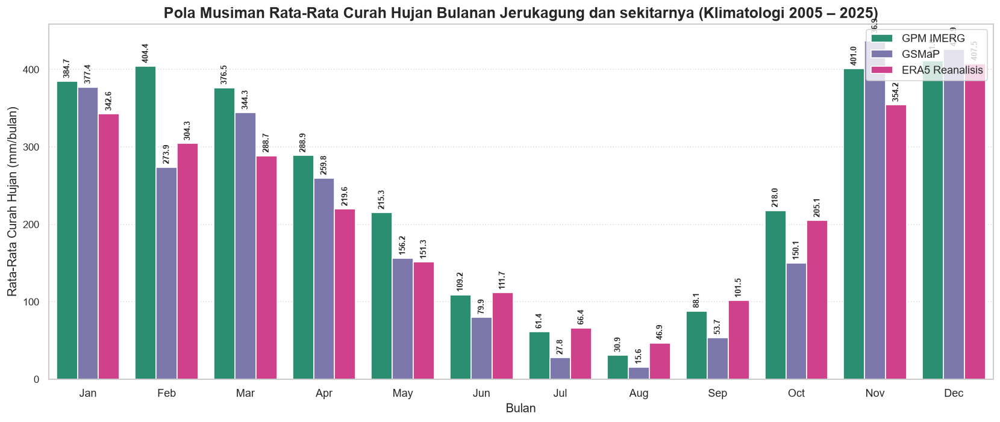

In [33]:
# Sel 16.1: Grafik Batang (Bar Chart) Klimatologi Bulanan (Jan - Des)
base_sat_dir = os.path.join(base_dir, 'Data_Satelit') if 'base_dir' in locals() else 'Google_Earth_Engine/Data_Satelit'
out_dir = os.path.join(base_dir, 'Hasil_Analisis') if 'base_dir' in locals() else 'Google_Earth_Engine/Hasil_Analisis'
os.makedirs(out_dir, exist_ok=True)
# Konstruksi DataFrame Bulanan 2005 - 2025
df_m_combined = pd.DataFrame({
    'ERA5': monthly_rain_era5,
    'GSMaP': monthly_rain_gsmap,
    'IMERG': monthly_rain_imerg
})
df_m_combined['Month_Name'] = df_m_combined.index.strftime('%b')
df_m_combined['Month_Num'] = df_m_combined.index.month
# Hitung Rata-Rata Klimatologi Bulanan (2005 - 2025)
df_climatology_list = []
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
for m in range(1, 13):
    sub_m = df_m_combined[df_m_combined['Month_Num'] == m]
    for dataset in ['IMERG', 'GSMaP', 'ERA5']:
        df_climatology_list.append({
            'Bulan_Num': m,
            'Bulan': month_names[m-1],
            'Dataset': 'GPM IMERG' if dataset=='IMERG' else ('ERA5 Reanalisis' if dataset=='ERA5' else dataset),
            'Curah_Hujan_mm': sub_m[dataset].mean()
        })
df_clim = pd.DataFrame(df_climatology_list)
# Plot Bar Chart Klimatologi Bulanan
plt.figure(figsize=(14, 6))
ax_bar = sns.barplot(
    data=df_clim,
    x='Bulan',
    y='Curah_Hujan_mm',
    hue='Dataset',
    palette=['#1b9e77', '#7570b3', '#e7298a']
)
plt.title('Pola Musiman Rata-Rata Curah Hujan Bulanan Jerukagung dan sekitarnya (Klimatologi 2005 – 2025)', fontsize=15, fontweight='bold')
plt.xlabel('Bulan', fontsize=12)
plt.ylabel('Rata-Rata Curah Hujan (mm/bulan)', fontsize=12)
plt.xticks(fontsize=11)
plt.yticks(fontsize=10)
plt.grid(True, axis='y', linestyle=':', alpha=0.6)
# Labels di atas setiap bar
for container in ax_bar.containers:
    ax_bar.bar_label(container, fmt='%.1f', fontsize=8, fontweight='bold', padding=3, rotation=90)
plt.legend(loc='upper right', fontsize=11)
plt.tight_layout()
plt.savefig(os.path.join(out_dir, 'monthly_climatology_barchart_2005_2025.png'), dpi=300, bbox_inches='tight')
plt.show()


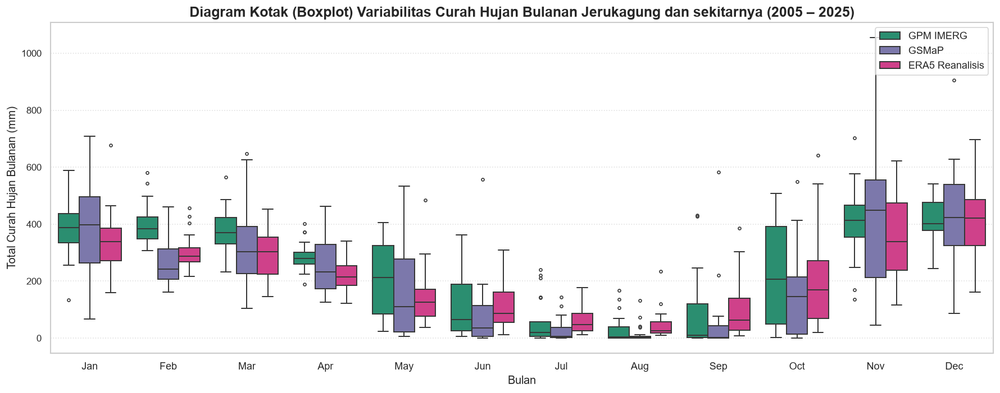

In [34]:
# Sel 16.3: Diagram Kotak (Boxplot) Temporal Per Bulan (Variabilitas & Outliers)
df_box_data = df_m_combined.melt(
    id_vars=['Month_Num', 'Month_Name'],
    value_vars=['IMERG', 'GSMaP', 'ERA5'],
    var_name='Dataset',
    value_name='Monthly_Rain_mm'
)
df_box_data['Dataset'] = df_box_data['Dataset'].replace({'IMERG': 'GPM IMERG', 'ERA5': 'ERA5 Reanalisis'})
plt.figure(figsize=(15, 6))
ax_box_m = sns.boxplot(
    data=df_box_data,
    x='Month_Name',
    y='Monthly_Rain_mm',
    hue='Dataset',
    palette=['#1b9e77', '#7570b3', '#e7298a'],
    showfliers=True,
    fliersize=3,
    linewidth=1.2
)
plt.title('Diagram Kotak (Boxplot) Variabilitas Curah Hujan Bulanan Jerukagung dan sekitarnya (2005 – 2025)', fontsize=15, fontweight='bold')
plt.xlabel('Bulan', fontsize=12)
plt.ylabel('Total Curah Hujan Bulanan (mm)', fontsize=12)
plt.xticks(fontsize=11)
plt.yticks(fontsize=10)
plt.grid(True, axis='y', linestyle=':', alpha=0.6)
plt.legend(loc='upper right', fontsize=11)
plt.tight_layout()
plt.savefig(os.path.join(out_dir, 'monthly_rainfall_variability_boxplot.png'), dpi=300, bbox_inches='tight')
plt.show()


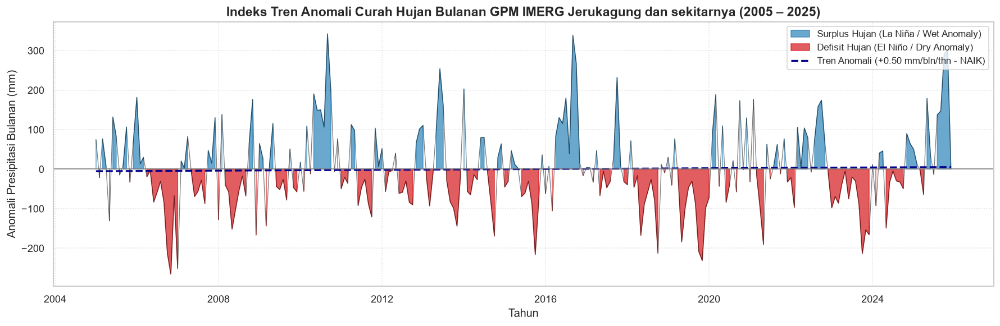

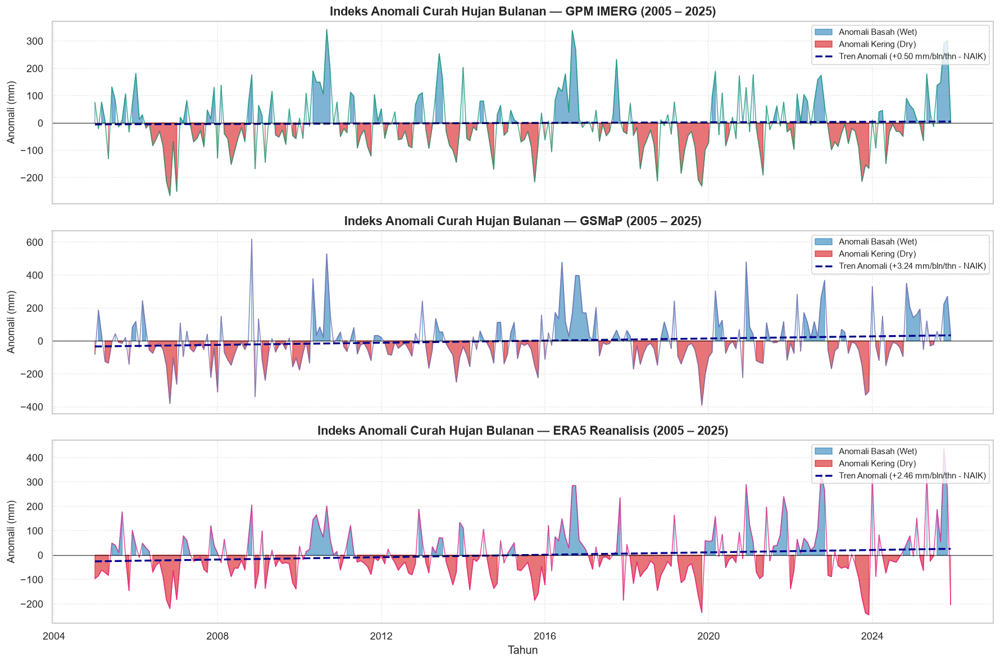

In [35]:
# Sel 16.4: Grafik Tren Anomali Curah Hujan Bulanan (Rainfall Anomaly Index 2005 - 2025)
# 1. Indeks Tren Anomali Curah Hujan Bulanan GPM IMERG
m_imerg = df_imerg_hourly_lt['precipitation'].resample('1MS').sum()
climatology_m = m_imerg.groupby(m_imerg.index.month).transform('mean')
anomaly_m = m_imerg - climatology_m

plt.figure(figsize=(15, 5))
plt.fill_between(anomaly_m.index, anomaly_m.values, 0, where=(anomaly_m.values >= 0), color='#2b83ba', alpha=0.7, label='Surplus Hujan (La Niña / Wet Anomaly)')
plt.fill_between(anomaly_m.index, anomaly_m.values, 0, where=(anomaly_m.values < 0), color='#d7191c', alpha=0.7, label='Defisit Hujan (El Niño / Dry Anomaly)')
plt.plot(anomaly_m.index, anomaly_m.values, color='black', linewidth=0.8, alpha=0.5)

x_num_anom = (anomaly_m.index - anomaly_m.index[0]).total_seconds() / (86400 * 365.25)
slope_anom, intercept_anom = np.polyfit(x_num_anom, anomaly_m.values, 1)
plt.plot(anomaly_m.index, slope_anom * x_num_anom + intercept_anom, color='darkblue', linestyle='--', linewidth=2, label=f'Tren Anomali ({slope_anom:+.2f} mm/bln/thn - NAIK)')

plt.axhline(0, color='gray', linestyle='-', linewidth=1)
plt.title('Indeks Tren Anomali Curah Hujan Bulanan GPM IMERG Jerukagung dan sekitarnya (2005 – 2025)', fontsize=14, fontweight='bold')
plt.xlabel('Tahun', fontsize=12)
plt.ylabel('Anomali Presipitasi Bulanan (mm)', fontsize=12)
plt.grid(True, linestyle=':', alpha=0.6)
plt.legend(loc='upper right', fontsize=10)
plt.tight_layout()
if 'out_dir' in locals():
    plt.savefig(os.path.join(out_dir, 'monthly_rainfall_anomaly_trend_2005_2025.png'), dpi=300, bbox_inches='tight')
plt.show()

# 2. Line Chart Anomali Curah Hujan Bulanan & Tren (2005 - 2025) — 3 Satelit / Reanalisis
clim_mean = df_m_combined.groupby('Month_Num')[['IMERG', 'GSMaP', 'ERA5']].transform('mean')
df_anomaly = df_m_combined[['IMERG', 'GSMaP', 'ERA5']] - clim_mean
fig, axes = plt.subplots(3, 1, figsize=(15, 10), sharex=True)
datasets = [('IMERG', 'GPM IMERG', '#1b9e77'), ('GSMaP', 'GSMaP', '#7570b3'), ('ERA5', 'ERA5 Reanalisis', '#e7298a')]
x_dates = df_anomaly.index
x_num = (x_dates - x_dates[0]).total_seconds() / (86400 * 365.25)

for i, (col, title, color) in enumerate(datasets):
    ax = axes[i]
    vals = df_anomaly[col].values
    ax.fill_between(x_dates, vals, 0, where=(vals >= 0), color='#2b83ba', alpha=0.6, label='Anomali Basah (Wet)')
    ax.fill_between(x_dates, vals, 0, where=(vals < 0), color='#d7191c', alpha=0.6, label='Anomali Kering (Dry)')
    ax.plot(x_dates, vals, color=color, linewidth=1, alpha=0.8)
    
    slope_a, int_a = np.polyfit(x_num, vals, 1)
    trend_a = slope_a * x_num + int_a
    trend_lbl = 'NAIK' if slope_a > 0 else 'TURUN'
    ax.plot(x_dates, trend_a, color='darkblue', linestyle='--', linewidth=2, label=f'Tren Anomali ({slope_a:+.2f} mm/bln/thn - {trend_lbl})')
    ax.axhline(0, color='black', linestyle='-', linewidth=0.8, alpha=0.7)
    ax.set_title(f'Indeks Anomali Curah Hujan Bulanan — {title} (2005 – 2025)', fontsize=13, fontweight='bold')
    ax.set_ylabel('Anomali (mm)', fontsize=11)
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.legend(loc='upper right', fontsize=9)

axes[-1].set_xlabel('Tahun', fontsize=12)
plt.tight_layout()
if 'out_dir' in locals():
    plt.savefig(os.path.join(out_dir, 'monthly_rainfall_anomaly_trend_3satellites_2005_2025.png'), dpi=300, bbox_inches='tight')
plt.show()
